In [79]:
import rasterio
import yaml
from datetime import datetime, timedelta
import numpy as np
import pandas as pd
import math
import os
os.chdir("/scratch/ewalt/pdm/rs-uncertainty")
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
sns.set_style("whitegrid")

In [80]:
def pjoin(*subs): return Path(os.path.join(*subs))
def parse_date(date_str) -> datetime: return datetime.strptime(date_str, '%Y%m%d')

# 1. S2 cloud band statistics

**Motivation**: Understand the cloud distribution

In [211]:
class TemporalHistogram():
    def __init__(
        self,
        num_projects, 
        num_dates,
        num_bins,
        dates_range,
        bins_range=(0,1)
    ):
        dates_range = [np.datetime64(date, "s") for date in dates_range]
        self.num_projects = num_projects
        self.num_dates = num_dates
        self.num_bins = num_bins
        self.counts = np.zeros((num_projects, num_dates, num_bins))
        self.bins = np.linspace(*bins_range, self.num_bins)
        dates_range = (datetime(2015, 7, 1), datetime(2019, 2, 1))
        self.date_bins = pd.date_range(*dates_range, 40)
        self.date_bins_i8 = np.linspace(
            np.datetime64(self.date_bins[0], "s").view("i8"), 
            np.datetime64(self.date_bins[-1], "s").view("i8"), 40)
        self.project_map = {}
        self.project_counter = 0
        
    @property
    def inverted_project_map(self):
        return {v:k for k,v in self.project_map.items()}
    
    def add(self, values, project_id, date):
        # update map and counter if this is a new project
        if project_id in self.project_map.keys():
            project_idx = self.project_map[project_id]
        else:
            self.project_map[project_id] = self.project_counter
            project_idx = self.project_map[project_id]
            self.project_counter += 1
        # get date index
        date_idx = np.digitize(np.datetime64(date, "s").view("i8"), 
                               self.date_bins_i8)
        print(f"Date: {date}, idx: {date_idx}")
        # digitize values
        bin_ids = np.digitize(values, bins=self.bins)-1
        ids, cnts = np.unique(bin_ids, return_counts=True)
        self.counts[project_idx, date_idx, ids] += cnts
        
    def make_df(self, regions, add_global=True):
        if add_global and not "global" in regions.keys():
            regions["global"] = list(self.project_map.keys())
        data = {
            "region": [], 
            "project": [], 
            "date": [], 
            "s2_cp": [],
            "count": []
        }
        # region loop
        for region, projects in regions.items():
            # project loop
            for project in projects:
                if not project in self.project_map.keys(): continue
                project_idx = self.project_map[project]
                for bin_idx in range(self.num_bins):
                    for date_idx in range(self.num_dates):
                        if self.counts[project_idx, date_idx, bin_idx] != 0:
                            data["region"].append(region)
                            data["project"].append(project)
                            data["date"].append(self.date_bins[date_idx])
                            print(f"Date: {self.date_bins[date_idx]}, idx: {date_idx}")
                            data["s2_cp"].append(self.bins[bin_idx])
                            data["count"].append(self.counts[project_idx,date_idx,bin_idx])
        cdf = pd.DataFrame(data)
        return cdf

In [4]:
with open("config/create_dataset/baseline.yaml", "r") as f:
    cfg = yaml.safe_load(f)    

In [230]:
# arguments
patch_size = cfg["patch_size"]
s2_dir = cfg["s2_reprojected_dir"]
projects = cfg["projects"]

In [231]:
data = {"project_id": [], "date": [], "s2_cp": [],}
for project_id in projects:
    print("Loading", project_id)
    # images loop
    for img_path in pjoin(s2_dir, project_id).glob("*.tif"):
        with rasterio.open(img_path) as fh:
            cloud_map = fh.read(fh.count)
            date = parse_date(img_path.stem.split('_')[3].split('T')[0])
        for cp in cloud_map.flatten():
            data["project_id"].append(project_id)
            data["date"].append(date)
            data["s2_cp"].append(cp)
cpdf = pd.DataFrame(data)

Processing 346


KeyboardInterrupt: 

In [216]:

# histogram
num_projects = len(projects)
num_dates = 40
num_bins = 100
dates_range = (datetime(2015, 7, 1), datetime(2019, 2, 1))
bins_range = (0, 100)
th = TemporalHistogram(
    num_projects,
    num_dates,
    num_bins,
    dates_range,
    bins_range
)

# core
data = {"project_id": [], "date": [], "s2_cp": [],}
for project_id in projects:
    print("Processing", project_id)
    # images loop
    for img_path in pjoin(s2_dir, project_id).glob("*.tif"):
        with rasterio.open(img_path) as fh:
            cloud_map = fh.read(fh.count)
            date = parse_date(img_path.stem.split('_')[3].split('T')[0])
        # th.add(cloud_map.flatten(), project_id, date)
        for cp in cloud_map.flatten():
            data["project_id"].append(project_id)
            data["date"].append(date)
            data["s2_cp"].append(cp)
# make df
df = th.make_df(regions={
    "east": ['346', '9', '341', '354', '415', '418', '416', '429', '439', '560', '472', '521', '498',
        '522', '564', '764', '781', '825', '796', '805', '827', '891', '835', '920', '959', '1023', '998',
        '527', '477', '542', '471'],
    "west": ['528', '537', '792', '988', '769'],
    "north": ['819', '909', '896'],
}, add_global=True)

Processing 346
Date: 2015-08-22 00:00:00, idx: 2
Date: 2015-08-15 00:00:00, idx: 2
Date: 2015-08-15 00:00:00, idx: 2
Date: 2015-08-22 00:00:00, idx: 2
Processing 342
Date: 2015-08-15 00:00:00, idx: 2
Date: 2015-08-22 00:00:00, idx: 2
Processing 9
Date: 2015-08-22 00:00:00, idx: 2
Date: 2015-08-15 00:00:00, idx: 2
Date: 2015-08-22 00:00:00, idx: 2
Date: 2015-08-22 00:00:00, idx: 2
Date: 2015-08-15 00:00:00, idx: 2
Date: 2015-08-22 00:00:00, idx: 2
Date: 2015-08-15 00:00:00, idx: 2
Date: 2015-08-15 00:00:00, idx: 2
Processing 341
Date: 2015-08-15 00:00:00, idx: 2
Date: 2015-08-22 00:00:00, idx: 2
Processing 354
Date: 2015-08-22 00:00:00, idx: 2
Date: 2015-08-22 00:00:00, idx: 2
Date: 2015-08-15 00:00:00, idx: 2
Date: 2015-08-15 00:00:00, idx: 2
Processing 415
Date: 2015-08-15 00:00:00, idx: 2
Date: 2015-08-22 00:00:00, idx: 2
Date: 2015-08-15 00:00:00, idx: 2
Date: 2015-08-22 00:00:00, idx: 2
Processing 418
Date: 2015-08-22 00:00:00, idx: 2
Date: 2015-08-15 00:00:00, idx: 2
Date: 2015-08

Date: 2017-08-22 00:00:00, idx: 24
Date: 2017-07-05 00:00:00, idx: 22
Date: 2017-05-26 00:00:00, idx: 21
Date: 2017-07-05 00:00:00, idx: 22
Date: 2017-08-22 00:00:00, idx: 24
Date: 2017-05-26 00:00:00, idx: 21
Processing 988
Date: 2018-07-03 00:00:00, idx: 33
Date: 2018-09-18 00:00:00, idx: 35
Date: 2018-09-04 00:00:00, idx: 35
Date: 2018-06-08 00:00:00, idx: 32
Date: 2015-09-06 05:32:18.461538462, idx: 2
Date: 2015-09-06 05:32:18.461538462, idx: 2
Date: 2015-09-06 05:32:18.461538462, idx: 2
Date: 2015-09-06 05:32:18.461538462, idx: 2
Date: 2015-09-06 05:32:18.461538462, idx: 2
Date: 2015-09-06 05:32:18.461538462, idx: 2
Date: 2015-09-06 05:32:18.461538462, idx: 2
Date: 2015-09-06 05:32:18.461538462, idx: 2
Date: 2015-09-06 05:32:18.461538462, idx: 2
Date: 2015-09-06 05:32:18.461538462, idx: 2
Date: 2015-09-06 05:32:18.461538462, idx: 2
Date: 2015-09-06 05:32:18.461538462, idx: 2
Date: 2015-09-06 05:32:18.461538462, idx: 2
Date: 2015-09-06 05:32:18.461538462, idx: 2
Date: 2015-09-06 05

Date: 2017-09-14 18:27:41.538461544, idx: 24
Date: 2017-10-18 09:13:50.769230768, idx: 25
Date: 2017-09-14 18:27:41.538461544, idx: 24
Date: 2017-10-18 09:13:50.769230768, idx: 25
Date: 2017-09-14 18:27:41.538461544, idx: 24
Date: 2017-10-18 09:13:50.769230768, idx: 25
Date: 2017-09-14 18:27:41.538461544, idx: 24
Date: 2017-10-18 09:13:50.769230768, idx: 25
Date: 2017-09-14 18:27:41.538461544, idx: 24
Date: 2017-10-18 09:13:50.769230768, idx: 25
Date: 2017-09-14 18:27:41.538461544, idx: 24
Date: 2017-10-18 09:13:50.769230768, idx: 25
Date: 2017-08-12 03:41:32.307692312, idx: 23
Date: 2017-10-18 09:13:50.769230768, idx: 25
Date: 2017-08-12 03:41:32.307692312, idx: 23
Date: 2017-10-18 09:13:50.769230768, idx: 25
Date: 2017-08-12 03:41:32.307692312, idx: 23
Date: 2017-10-18 09:13:50.769230768, idx: 25
Date: 2017-08-12 03:41:32.307692312, idx: 23
Date: 2017-10-18 09:13:50.769230768, idx: 25
Date: 2017-08-12 03:41:32.307692312, idx: 23
Date: 2017-10-18 09:13:50.769230768, idx: 25
Date: 2017

Date: 2016-10-13 14:46:09.230769232, idx: 14
Date: 2016-09-10 00:00:00, idx: 13
Date: 2016-10-13 14:46:09.230769232, idx: 14
Date: 2016-09-10 00:00:00, idx: 13
Date: 2016-10-13 14:46:09.230769232, idx: 14
Date: 2016-09-10 00:00:00, idx: 13
Date: 2016-10-13 14:46:09.230769232, idx: 14
Date: 2016-09-10 00:00:00, idx: 13
Date: 2016-10-13 14:46:09.230769232, idx: 14
Date: 2017-06-05 22:09:13.846153848, idx: 21
Date: 2017-07-09 12:55:23.076923080, idx: 22
Date: 2017-09-14 18:27:41.538461544, idx: 24
Date: 2017-06-05 22:09:13.846153848, idx: 21
Date: 2017-07-09 12:55:23.076923080, idx: 22
Date: 2017-09-14 18:27:41.538461544, idx: 24
Date: 2017-06-05 22:09:13.846153848, idx: 21
Date: 2017-07-09 12:55:23.076923080, idx: 22
Date: 2017-09-14 18:27:41.538461544, idx: 24
Date: 2017-06-05 22:09:13.846153848, idx: 21
Date: 2017-07-09 12:55:23.076923080, idx: 22
Date: 2017-09-14 18:27:41.538461544, idx: 24
Date: 2017-06-05 22:09:13.846153848, idx: 21
Date: 2017-07-09 12:55:23.076923080, idx: 22
Date:

In [217]:
df

,region,project,date,s2_cp,count
0,east,346,2015-09-06 05:32:18.461538462,0.000000,41617064.0
1,east,346,2015-09-06 05:32:18.461538462,1.010101,131660.0
2,east,346,2015-09-06 05:32:18.461538462,2.020202,76574.0
3,east,346,2015-09-06 05:32:18.461538462,3.030303,51582.0
4,east,346,2015-09-06 05:32:18.461538462,4.040404,34598.0
...,...,...,...,...,...
17661,global,988,2018-07-14 07:23:04.615384624,98.989899,36.0
17662,global,988,2018-09-19 12:55:23.076923088,98.989899,16.0
17663,global,988,2018-06-10 16:36:55.384615392,100.000000,7550.0
17664,global,988,2018-07-14 07:23:04.615384624,100.000000,3220.0


In [218]:
date_df = df.groupby(["region","project","date"]).mean()
date_df

s2_cp          count
region project date                                                   
east   1023    2018-06-10 16:36:55.384615392  49.309421   27629.163265
               2018-07-14 07:23:04.615384624  50.000000   81229.740000
               2018-08-16 22:09:13.846153856  49.637792   27350.080808
               2018-10-23 03:41:32.307692320  50.000000   54153.160000
       341     2015-09-06 05:32:18.461538462  50.000000  212092.900000
...                                                 ...            ...
west   792     2017-09-14 18:27:41.538461544  50.000000   35298.560000
               2017-10-18 09:13:50.769230768  50.000000   35298.560000
       988     2018-06-10 16:36:55.384615392  50.000000  232250.600000
               2018-07-14 07:23:04.615384624  50.000000  232250.600000
               2018-09-19 12:55:23.076923088  50.000000  464501.200000

[190 rows x 2 columns]

<AxesSubplot:xlabel='date', ylabel='s2_cp'>

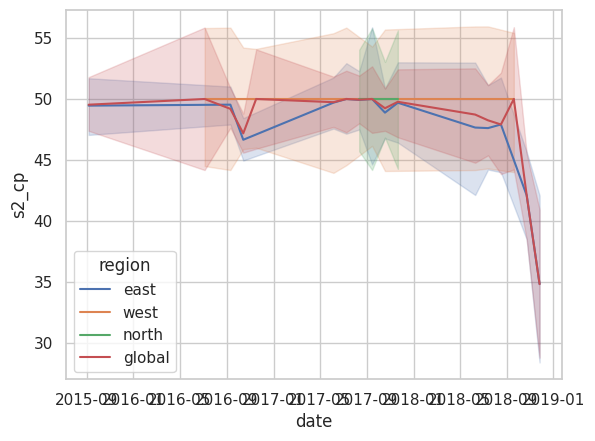

In [219]:
sns.lineplot(data=df, x="date", y="s2_cp", hue="region")

[None]

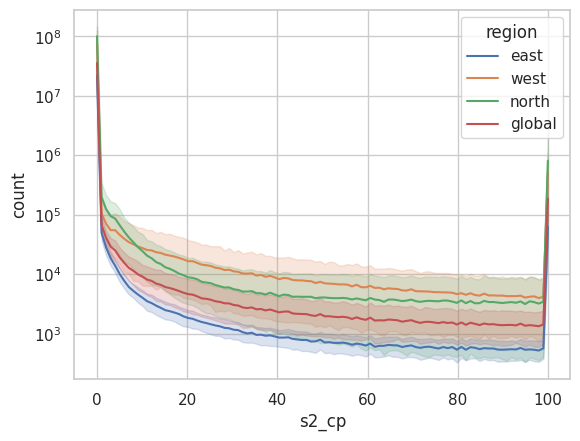

In [229]:
g = sns.lineplot(data=df, x="s2_cp", y="count", hue="region")
g.set(yscale="log")

# 2. Plot project indivually

In [233]:
data = {}
for project in os.scandir(Path("/scratch/ewalt/pdm/rs-uncertainty/assets/data/sentinel_data/s2_reprojected")):
    if project.name.isnumeric():
        data[project.name] = len(list(Path(project.path).glob("*.tif")))
data = dict(sorted(data.items(), key=lambda x: x[1], reverse=True))

In [242]:
def plot_project_cloud_maps(pid, max_cols=3, cmap="Spectral_r"):
    s2_dir = Path(f"/scratch/ewalt/pdm/rs-uncertainty/assets/data/sentinel_data/s2_reprojected/{pid}")
    cloud_maps = []
    dates = []
    s2_paths = list(s2_dir.glob("*.tif"))
    for i, s2_path in enumerate(s2_paths):
        with rasterio.open(s2_path) as fh:
            cloud_map = fh.read(13)
        cloud_maps.append(cloud_map)
        date = parse_date(s2_path.stem.split('_')[3].split('T')[0])
        dates.append(date)
    cloud_maps, dates = list(zip(*sorted(zip(cloud_maps, dates), key=lambda x: x[1])))
    N = len(cloud_maps)
    ncols = max_cols
    nrows = math.ceil(N/ncols)
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6*ncols,6*nrows))
    axs = axs.flatten()
    for i, (date, cloud_map) in enumerate(zip(dates, cloud_maps)):
        im = axs[i].imshow(cloud_map, cmap=cmap)
        axs[i].set_title(date.strftime("%d.%m.%Y %H:%M:%S"))
        axs[i].set_axis_off()
    fig.suptitle(pid)
    plt.tight_layout()
    plt.show()

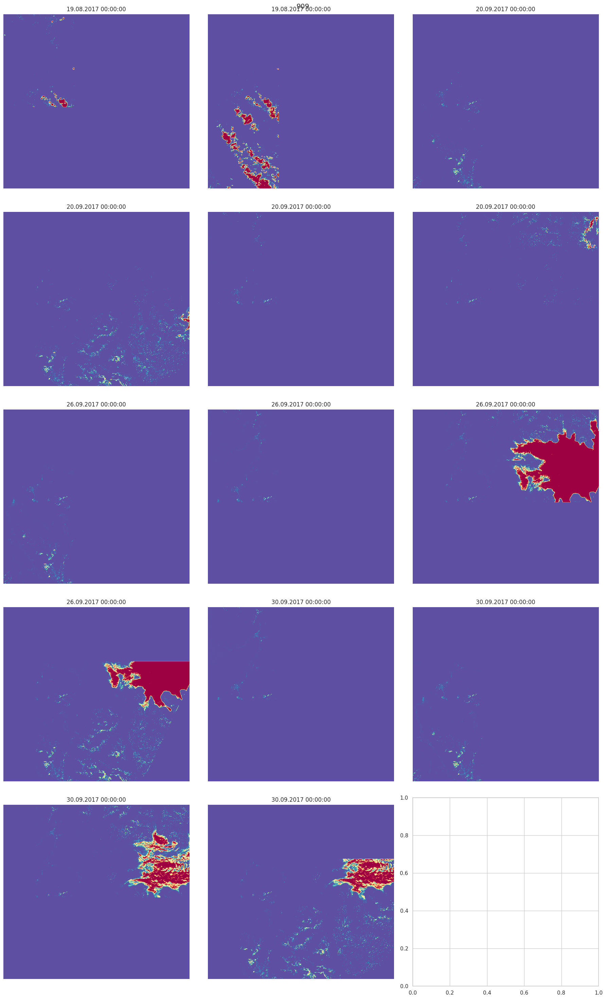

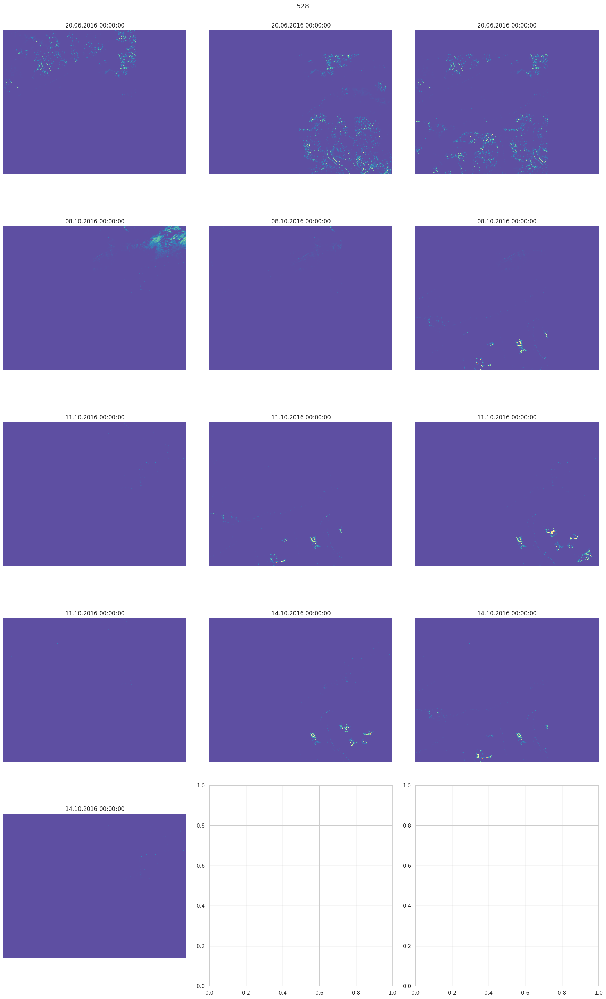

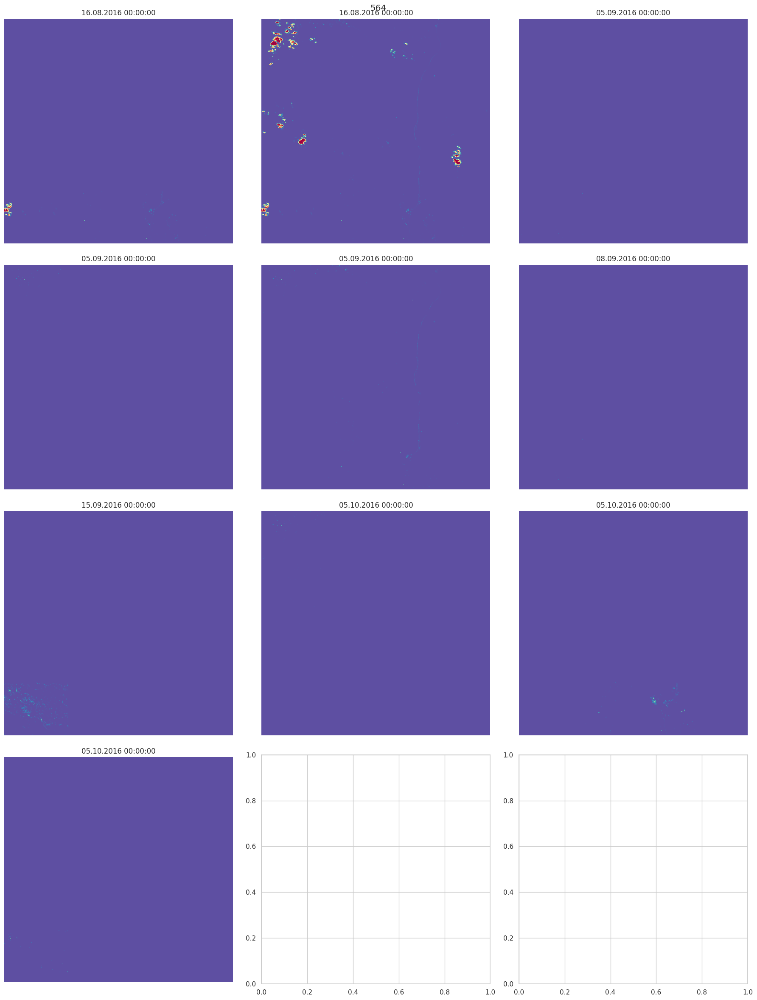

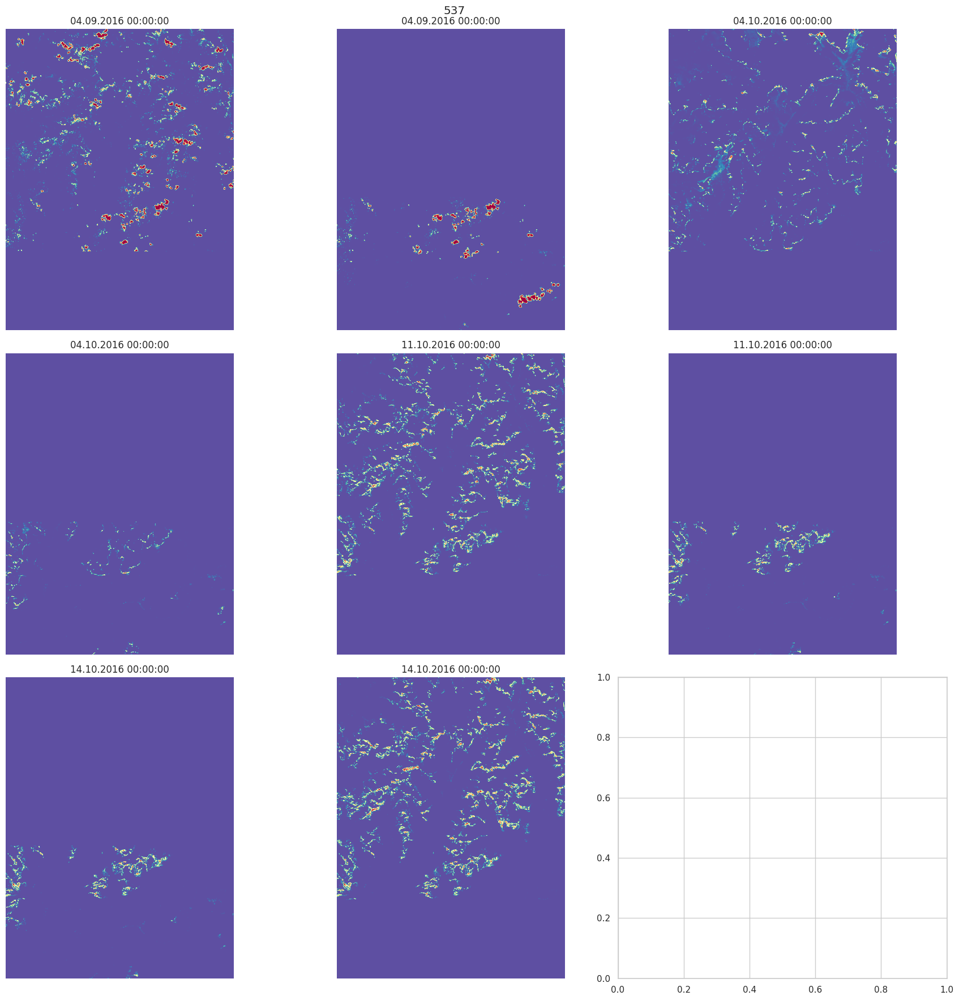

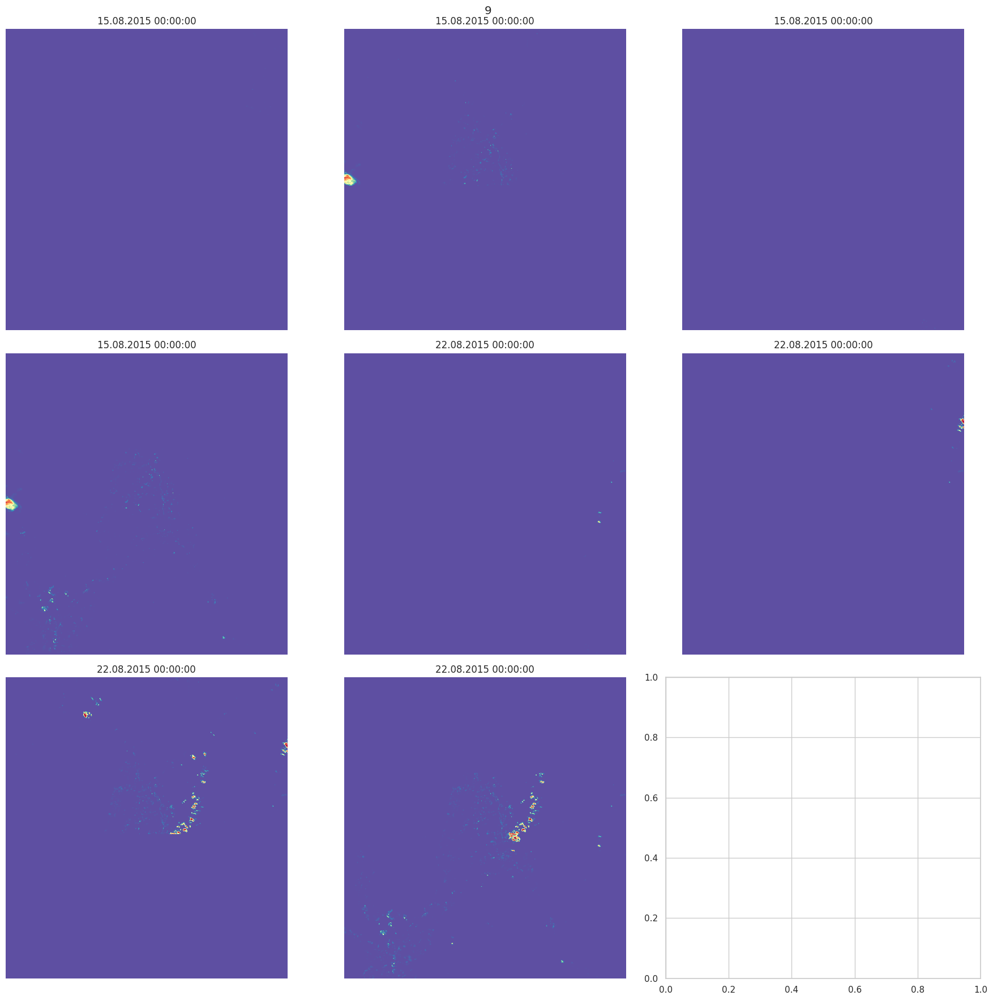

...

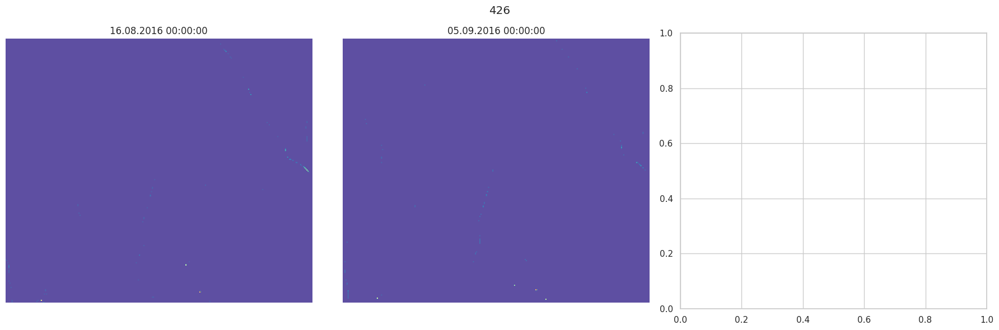

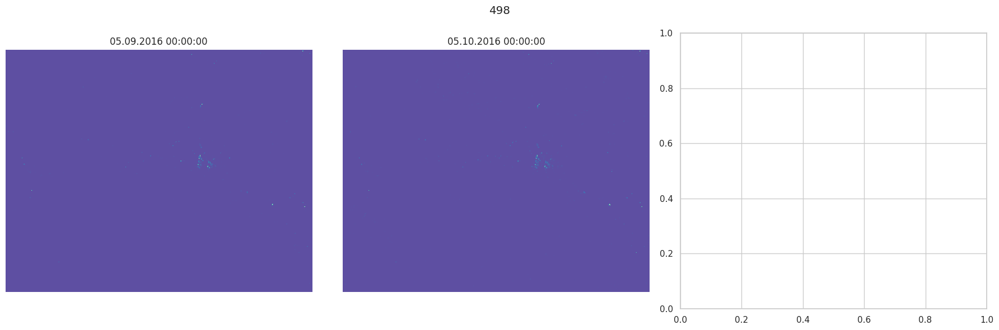

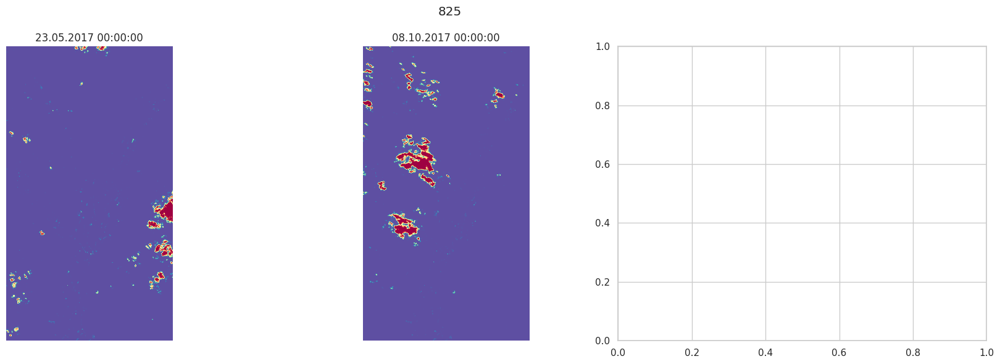

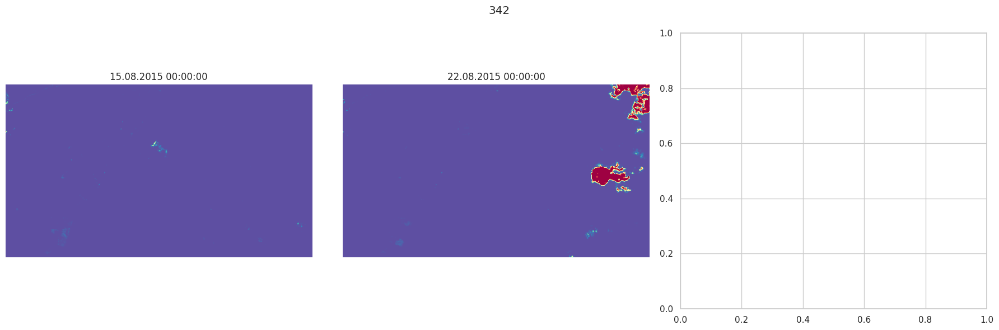

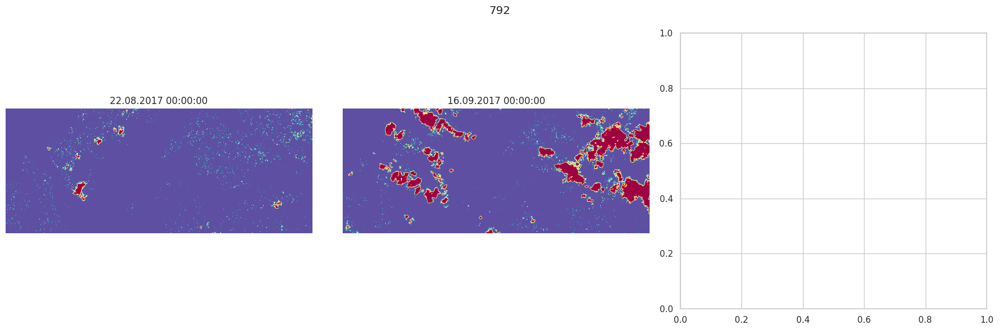

In [244]:
for pid, count in data.items():
    plot_project_cloud_maps(pid)

# Plot projects by date

In [1]:
import rasterio
import rasterio.warp
import rasterio.features
import fiona
import yaml
from datetime import datetime, timedelta
import numpy as np
import pandas as pd
import math
import os
os.chdir("/scratch/ewalt/pdm/rs-uncertainty")
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
sns.set_style("whitegrid")

In [3]:
def pjoin(*subs): return Path(os.path.join(*subs))
def parse_date(date_str) -> datetime: return datetime.strptime(date_str, '%Y%m%d')
def parse_gt_date(date_str) -> datetime: 
    # there are 2 gt date formats
    try: return datetime.strptime(date_str, "%Y-%m-%d")
    except: return datetime.strptime(date_str, "%Y/%m/%d")

In [78]:
def plot_date(date, paths, project_ids, df, max_cols=6, cmap="Spectral_r"):
    print(f"*********** {date.strftime('%d.%m.%Y %H:%M:%S')} ***********")
    # Load images
    cloud_maps = []
    for path in paths: # debug
        with rasterio.open(path) as f: 
            cloud_maps.append(f.read(13).astype("float16"))
    cloud_maps, project_ids = list(zip(
        *sorted(zip(cloud_maps, project_ids), key=lambda x: int(x[1]))))
    # figure
    N = len(cloud_maps)
    ncols = max_cols
    nrows = math.ceil(N/ncols)
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4*ncols,4*nrows))
    axs = axs.flatten()
    for i, (pid, cloud_map) in enumerate(zip(project_ids, cloud_maps)):
        axs[i].imshow(cloud_map, cmap=cmap)
        axs[i].set_title(pid)
        axs[i].set_axis_off()
    plt.tight_layout()
    plt.show()
    # avg cp
    avg_cp = np.mean(np.concatenate([cm.flatten() for cm in cloud_maps]))
    df.loc[df.date==date,"avg_cp"] = avg_cp

*********** 15.08.2015 00:00:00 ***********


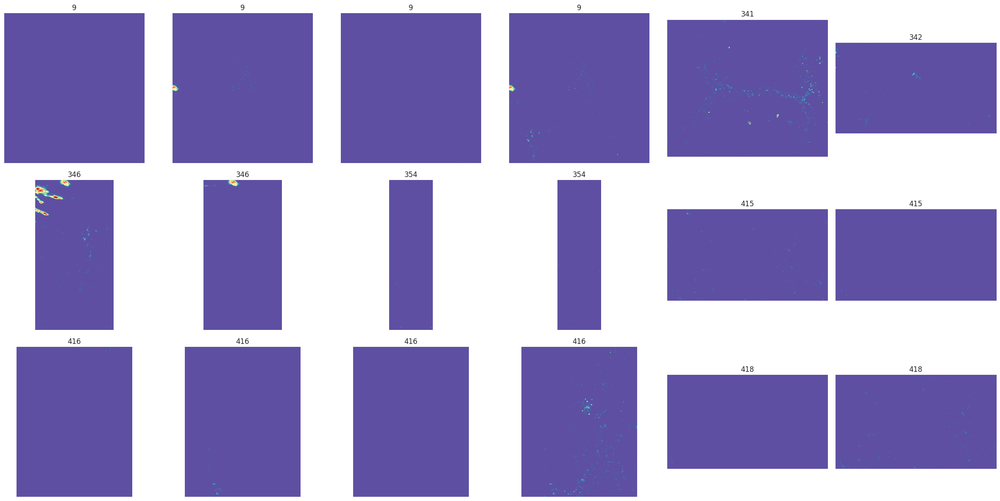

*********** 22.08.2015 00:00:00 ***********


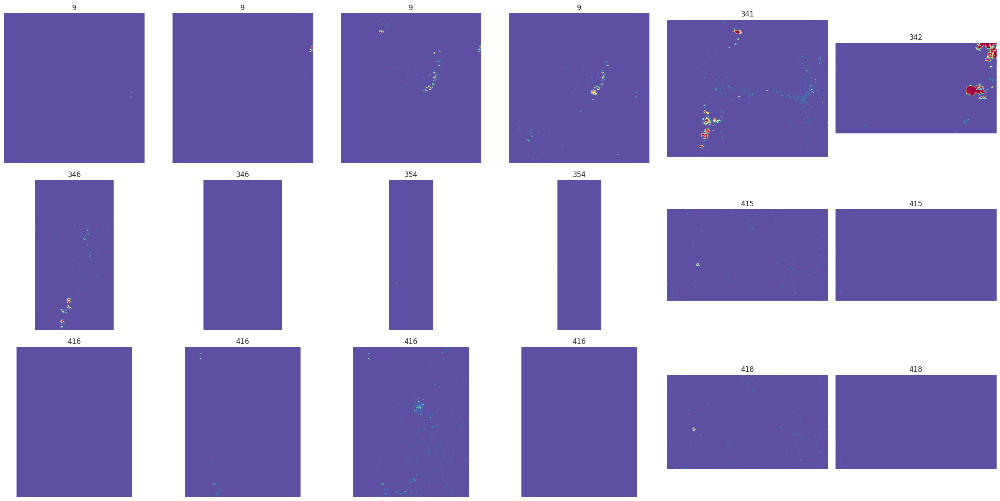

*********** 20.06.2016 00:00:00 ***********


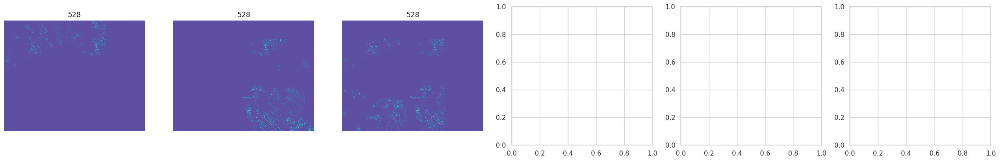

*********** 16.08.2016 00:00:00 ***********


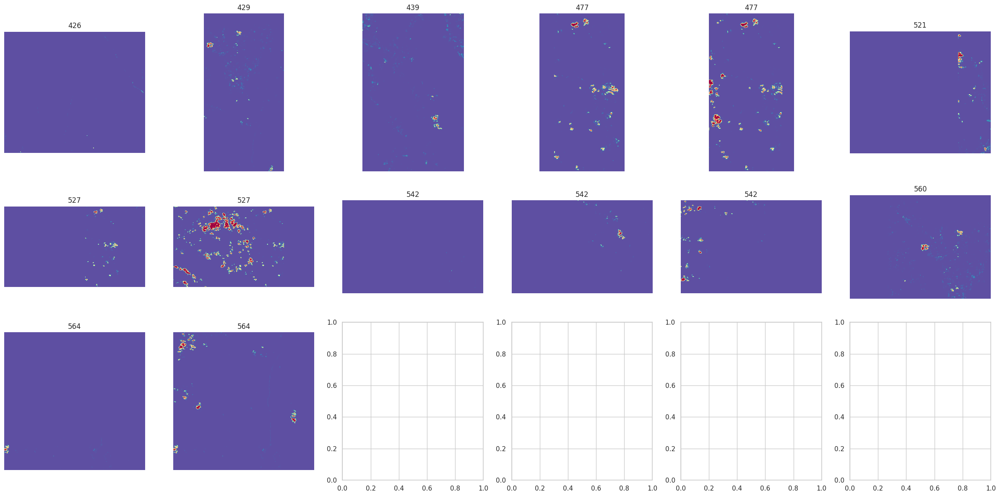

*********** 04.09.2016 00:00:00 ***********


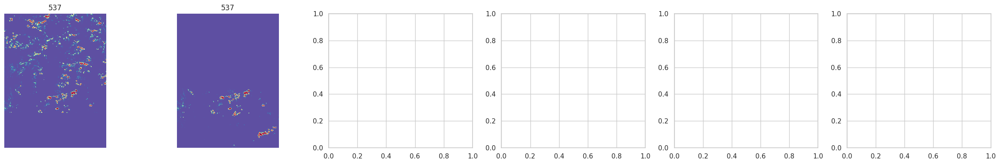

*********** 05.09.2016 00:00:00 ***********


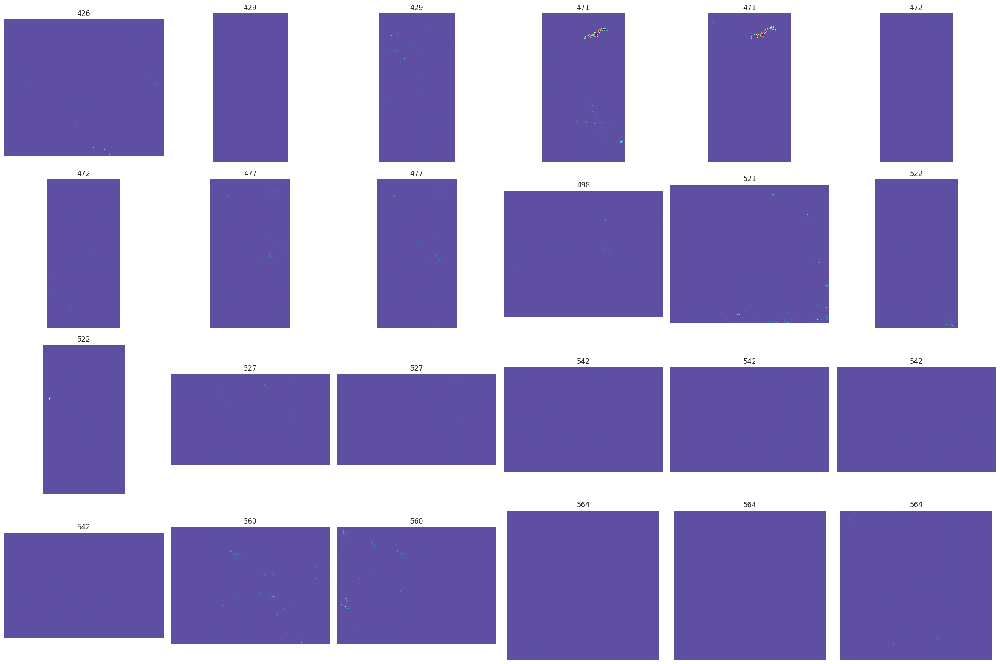

*********** 08.09.2016 00:00:00 ***********


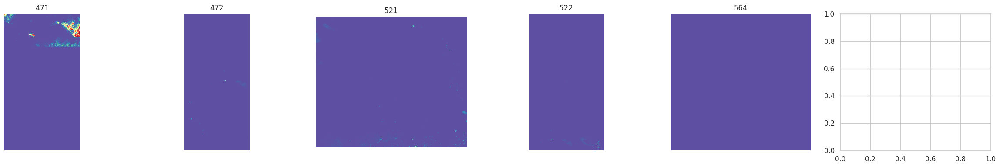

*********** 15.09.2016 00:00:00 ***********


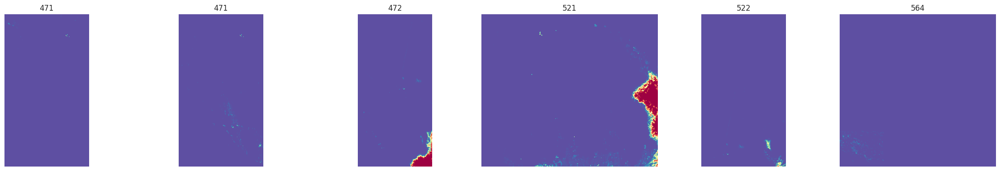

*********** 04.10.2016 00:00:00 ***********


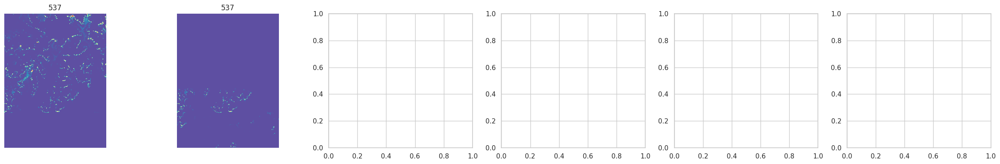

*********** 05.10.2016 00:00:00 ***********


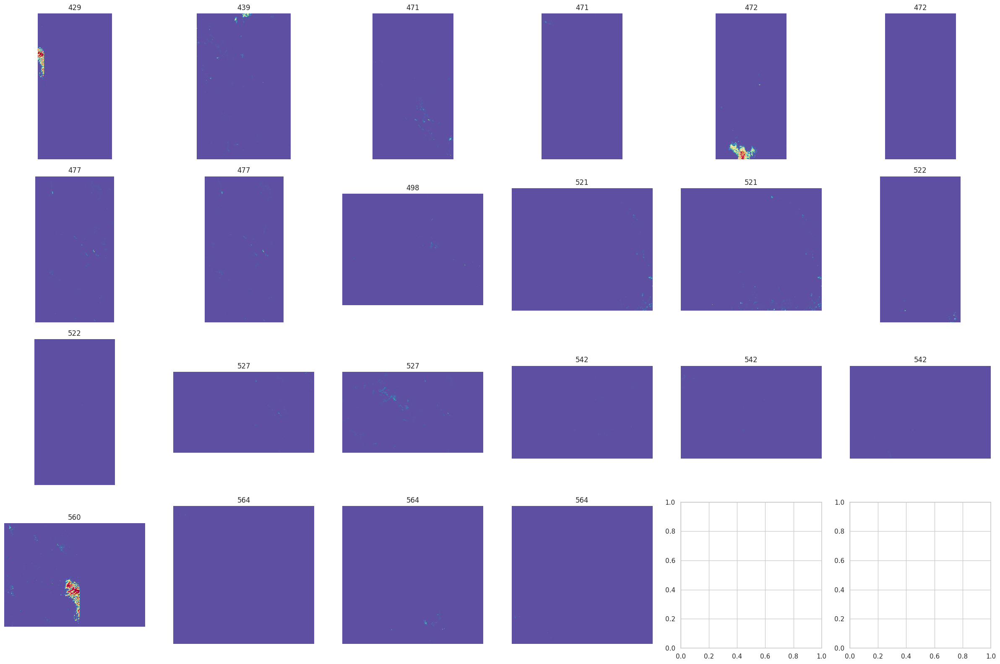

*********** 08.10.2016 00:00:00 ***********


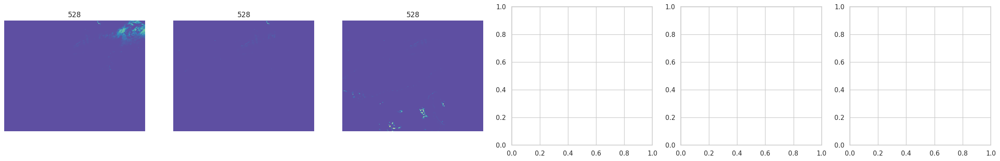

*********** 11.10.2016 00:00:00 ***********


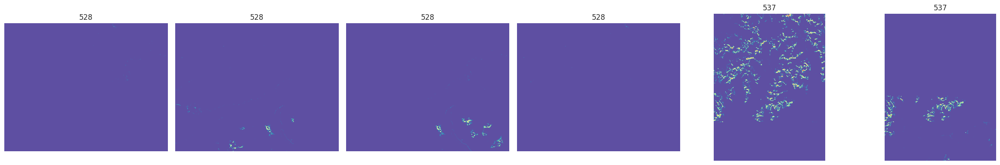

*********** 14.10.2016 00:00:00 ***********


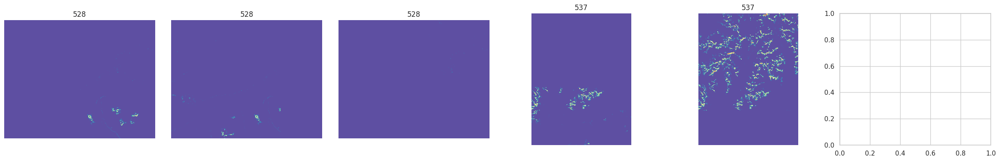

*********** 23.05.2017 00:00:00 ***********


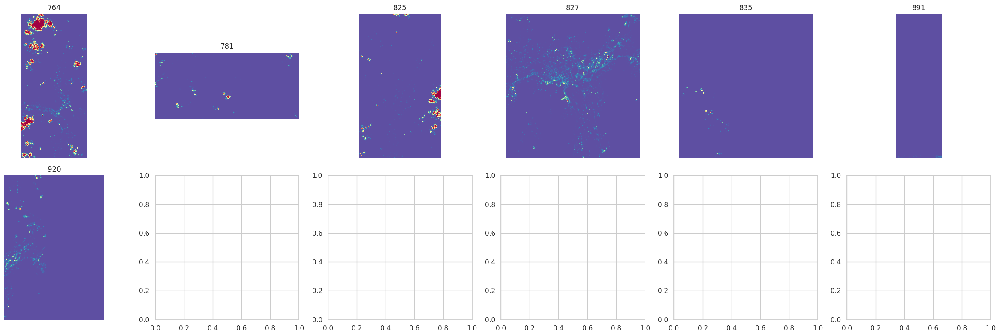

*********** 26.05.2017 00:00:00 ***********


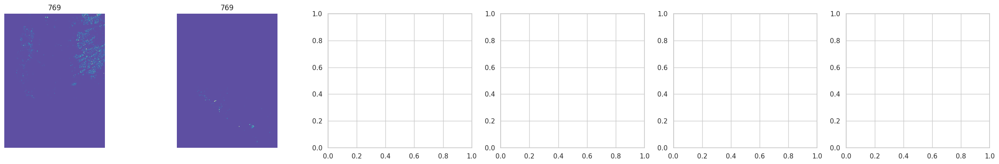

*********** 28.06.2017 00:00:00 ***********


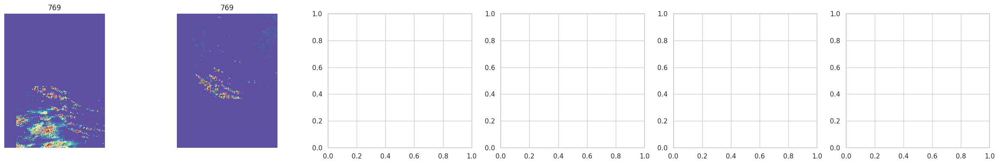

*********** 30.06.2017 00:00:00 ***********


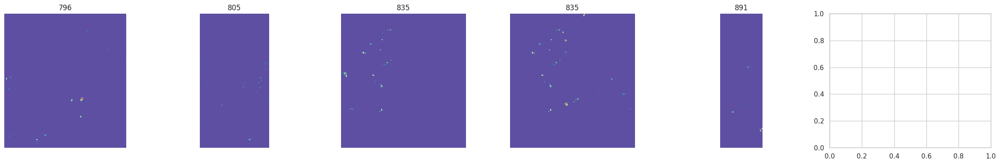

*********** 05.07.2017 00:00:00 ***********


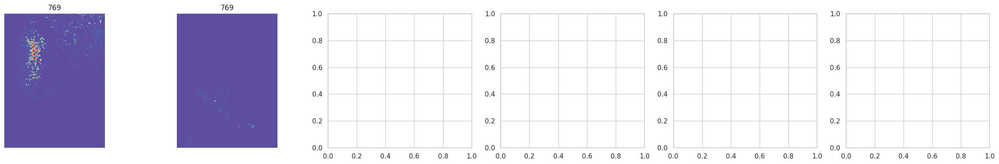

*********** 20.07.2017 00:00:00 ***********


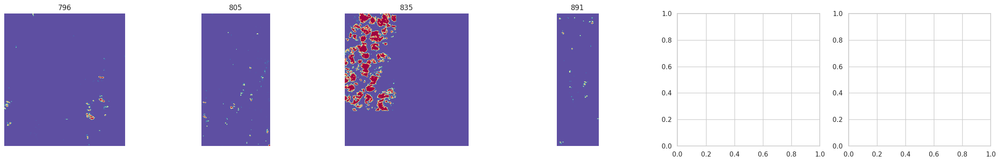

*********** 21.07.2017 00:00:00 ***********


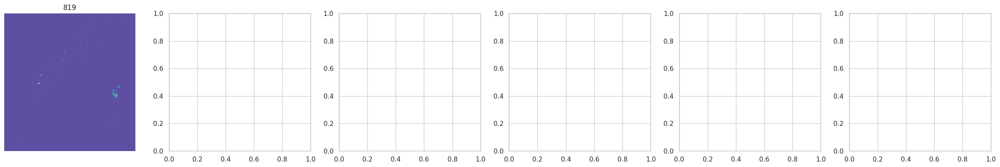

*********** 04.08.2017 00:00:00 ***********


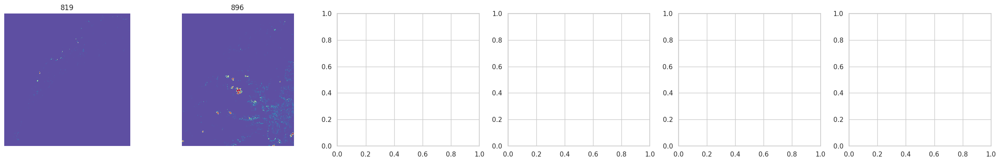

*********** 11.08.2017 00:00:00 ***********


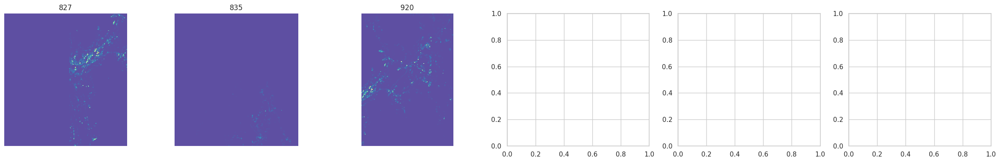

*********** 19.08.2017 00:00:00 ***********


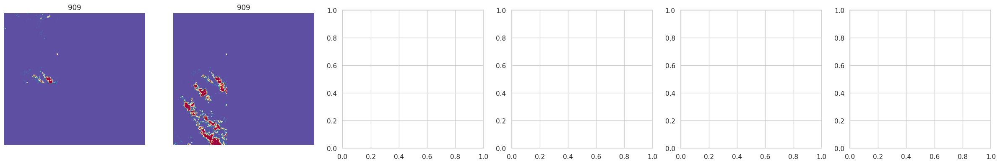

*********** 22.08.2017 00:00:00 ***********


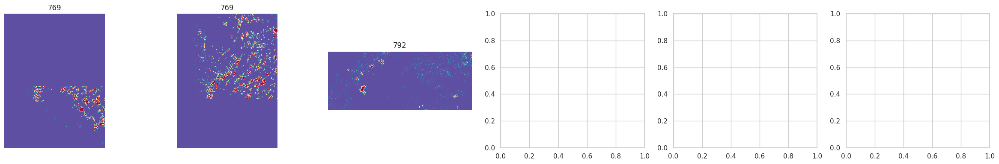

*********** 26.08.2017 00:00:00 ***********


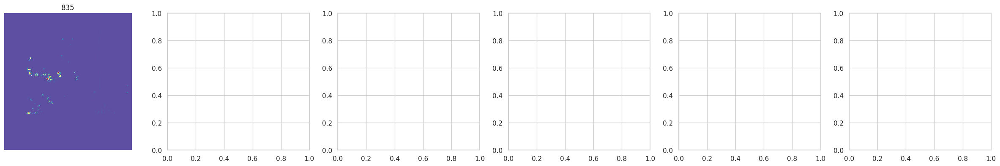

*********** 16.09.2017 00:00:00 ***********


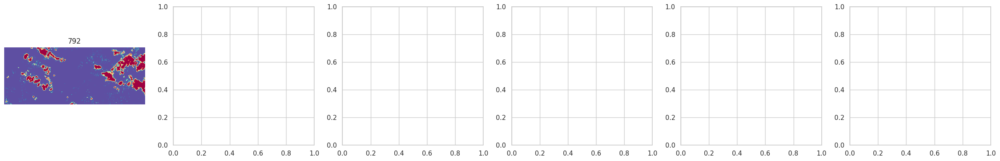

*********** 19.09.2017 00:00:00 ***********


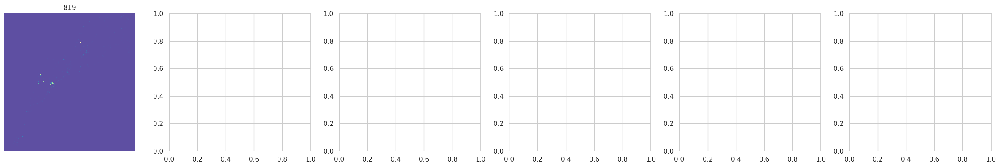

*********** 20.09.2017 00:00:00 ***********


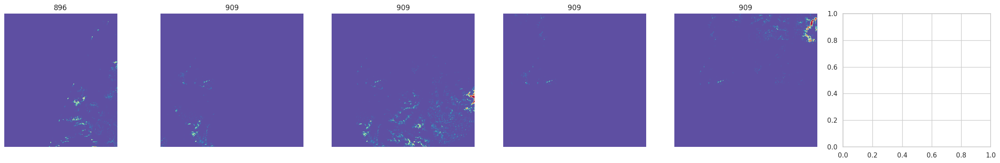

*********** 26.09.2017 00:00:00 ***********


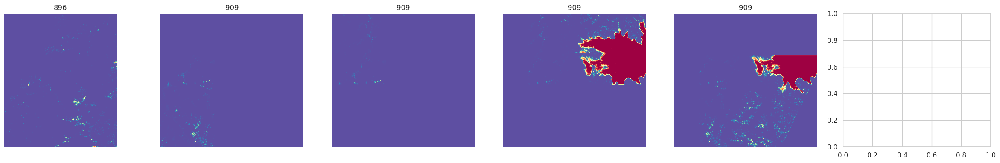

*********** 29.09.2017 00:00:00 ***********


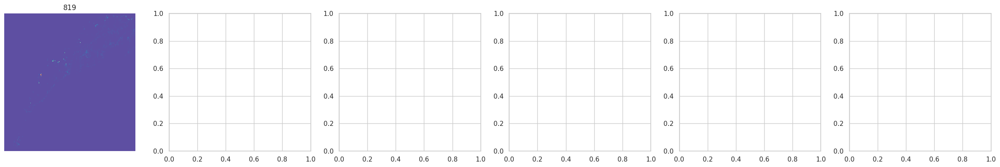

*********** 30.09.2017 00:00:00 ***********


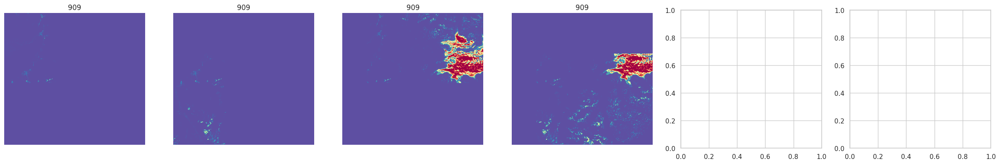

*********** 01.10.2017 00:00:00 ***********


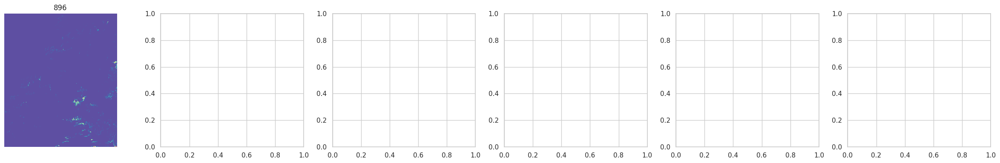

*********** 05.10.2017 00:00:00 ***********


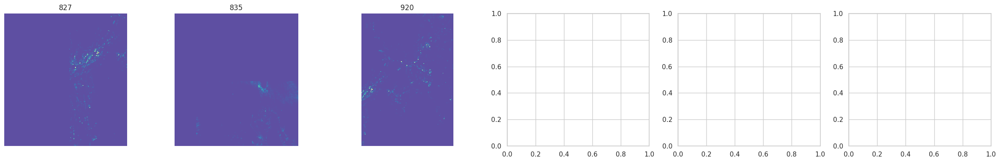

*********** 08.10.2017 00:00:00 ***********


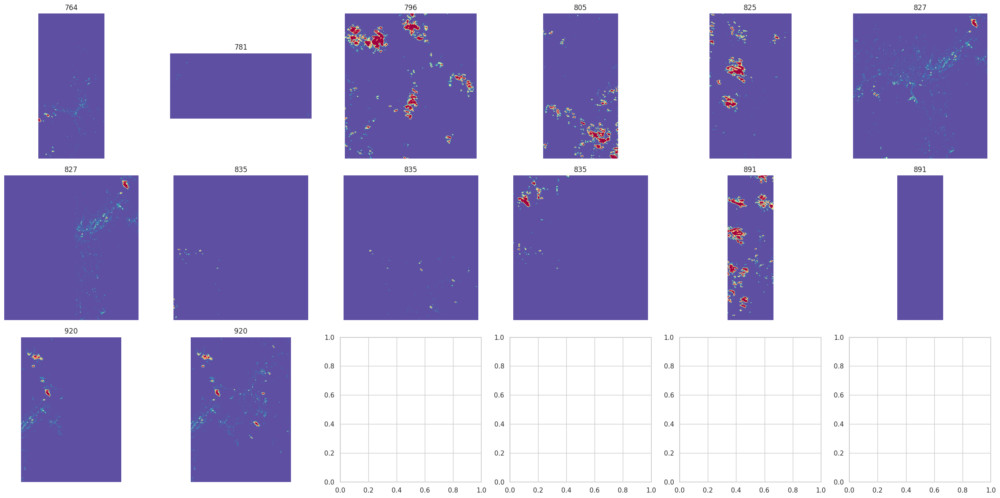

*********** 21.10.2017 00:00:00 ***********


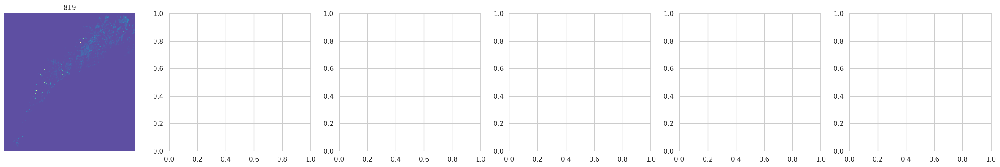

*********** 28.10.2017 00:00:00 ***********


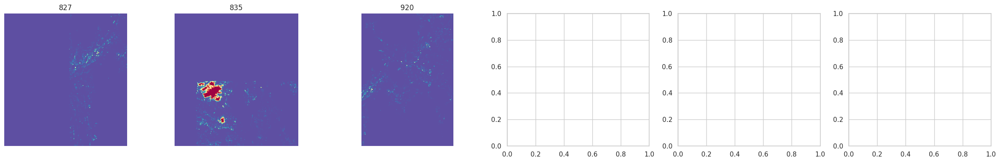

*********** 05.06.2018 00:00:00 ***********


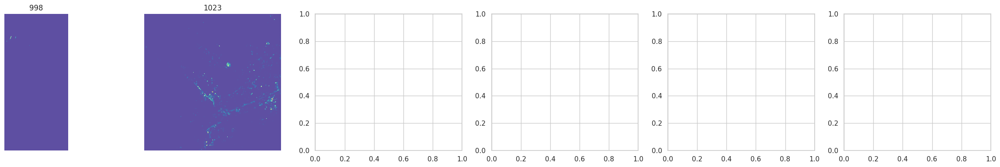

*********** 08.06.2018 00:00:00 ***********


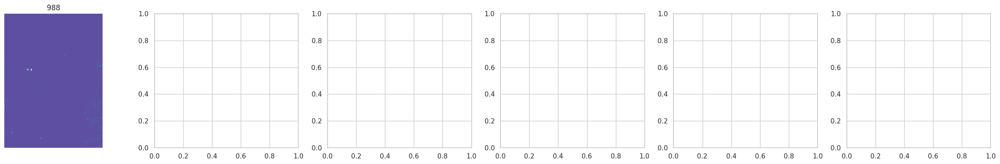

*********** 12.06.2018 00:00:00 ***********


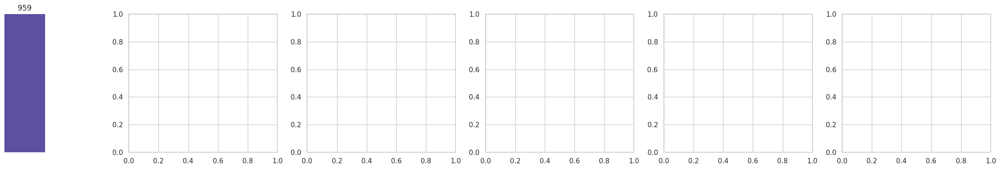

*********** 30.06.2018 00:00:00 ***********


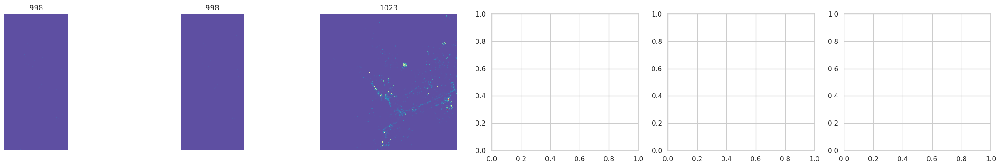

*********** 02.07.2018 00:00:00 ***********


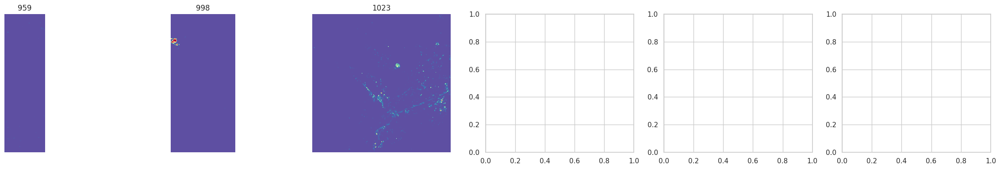

*********** 03.07.2018 00:00:00 ***********


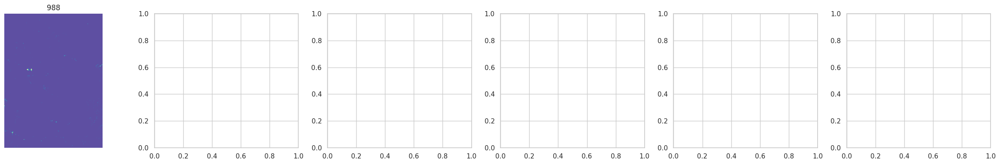

*********** 05.07.2018 00:00:00 ***********


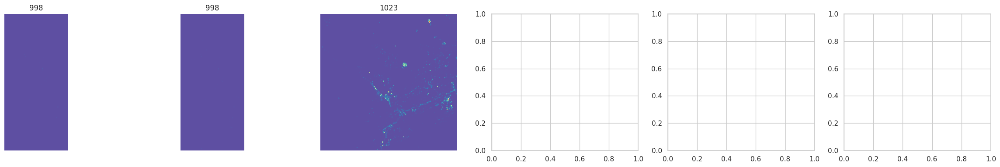

*********** 15.07.2018 00:00:00 ***********


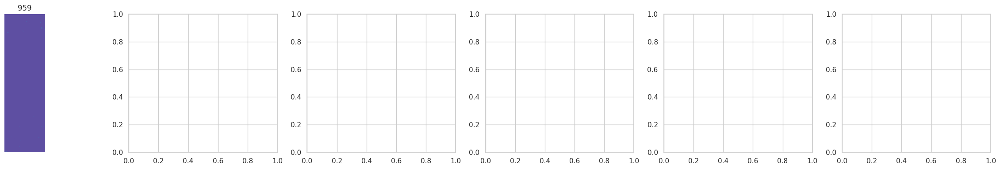

*********** 27.07.2018 00:00:00 ***********


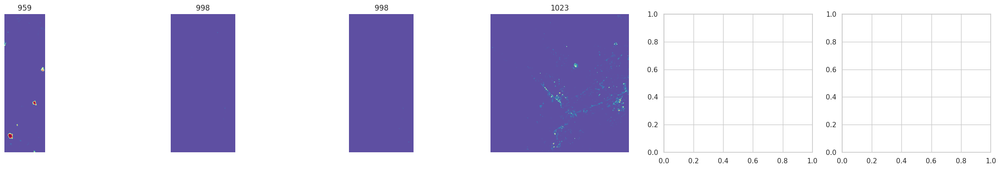

*********** 04.09.2018 00:00:00 ***********


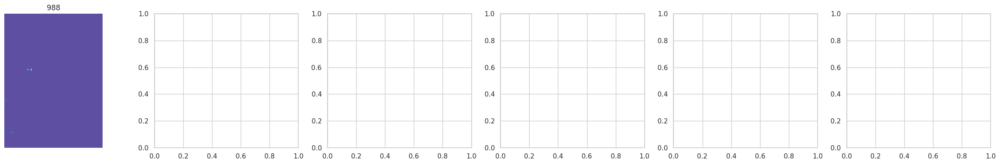

*********** 18.09.2018 00:00:00 ***********


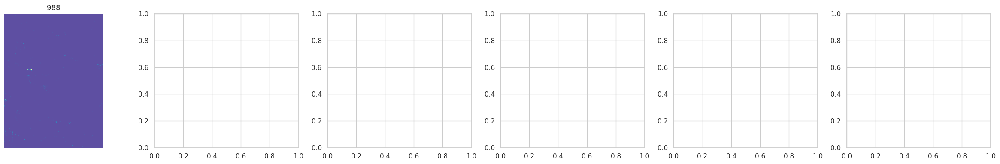

*********** 10.10.2018 00:00:00 ***********


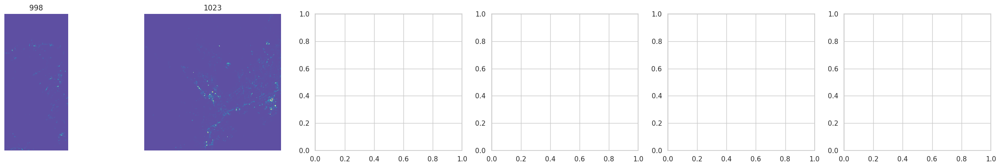

*********** 18.10.2018 00:00:00 ***********


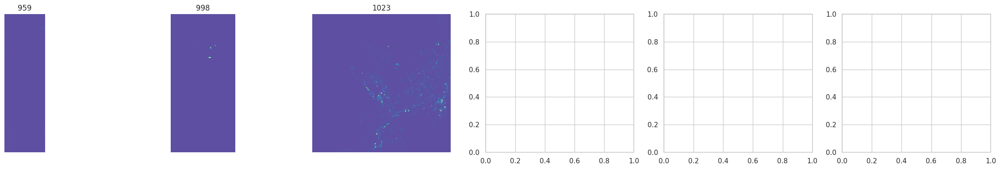

*********** 28.10.2018 00:00:00 ***********


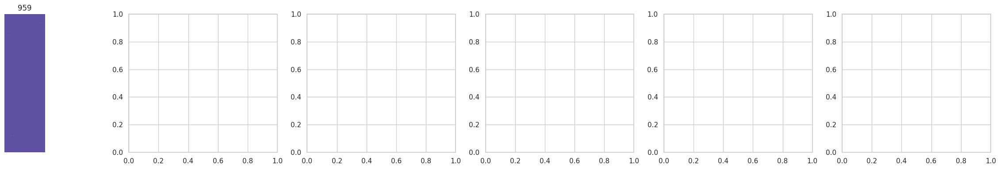

0     None
1     None
2     None
3     None
4     None
5     None
6     None
7     None
8     None
9     None
10    None
11    None
12    None
13    None
14    None
15    None
16    None
17    None
18    None
19    None
20    None
21    None
22    None
23    None
24    None
25    None
26    None
27    None
28    None
29    None
30    None
31    None
32    None
33    None
34    None
35    None
36    None
37    None
38    None
39    None
40    None
41    None
42    None
43    None
44    None
45    None
46    None
47    None
48    None
49    None
dtype: object

In [79]:
with open("config/create_dataset/baseline.yaml") as f:
    cfg = yaml.safe_load(f)
    
def plot_projects_by_date(cfg):
    projects = cfg["projects"]
    dates, s2_paths, project_ids = [], [], []
    for project_id in projects:
        these_paths = list(pjoin(cfg["s2_reprojected_dir"], project_id).glob("*.tif"))
        s2_paths.extend(these_paths)
        dates.extend([parse_date(p.stem.split('_')[3].split('T')[0]) for p in these_paths])
        project_ids.extend([project_id for _ in range(len(these_paths))])
    dppdf = pd.DataFrame({"date": dates, "s2_paths": s2_paths, "project_ids": project_ids})
    dppdf = dppdf.groupby(["date"]).agg(lambda x: list(x)).reset_index()
    dppdf["avg_cp"] = np.nan
    dppdf.apply(lambda x: plot_date(x.date, x.s2_paths, x.project_ids, dppdf), axis=1)
    plt.figure(figsize=(12, 8))
    sns.lineplot(data=dppdf, x="date", y="avg_cp")
    plt.xaxis(rotation=45)
    plt.ylabel("avg cloud probability")
    plt.show()

In [1]:
sns.lineplot(data=dppdf, x="date", y="avg_cp")
plt.xaxis(rotation=45)
plt.show()

NameError: name 'sns' is not defined

# Plot patches timeseries

In [212]:
import fiona
import rasterio
import rasterio.warp
import rasterio.features
from tqdm import tqdm
import random

In [82]:
def pjoin(*subs): return Path(os.path.join(*subs))
def parse_date(date_str) -> datetime: return datetime.strptime(date_str, '%Y%m%d')
def parse_gt_date(date_str) -> datetime: 
    # there are 2 gt date formats
    try: return datetime.strptime(date_str, "%Y-%m-%d")
    except: return datetime.strptime(date_str, "%Y/%m/%d")

In [83]:
def get_rasterized_polygon(project_id, cfg, gt_file):
    project_shape_collections = [fiona.open(p) for p in cfg['project_shapefiles']]
    # create the shape ("polygon") associated to the project 
    polygon, crs, gt_date = None, None, None
    for collection in project_shape_collections:
        try:
            polygon = [s['geometry'] for s in collection if s['properties']['kv_id'] == int(project_id)][0]
            crs = collection.crs
            gt_date = [s["properties"]["PUB_DATO"] for s in collection if s['properties']['kv_id'] == int(project_id)][0]
            gt_date = parse_gt_date(gt_date)
            break
        except IndexError: pass 
    if polygon is None: print("No polygon found")
    polygon = rasterio.warp.transform_geom(src_crs=crs, dst_crs=gt_file.crs, geom=polygon)
    rasterized_polygon = rasterized_polygon = rasterio.features.rasterize(
        [(polygon, 1)],
        out_shape=gt_file.shape,
        transform=gt_file.transform,
        fill=0,
        dtype='uint8'
    )
    return rasterized_polygon, gt_date

In [84]:
def load_project_data(project_id, cfg):
    # Create invalid mask (invalid=nan, valid=1)
    with rasterio.open(pjoin(cfg["gt_dir"], project_id+".tif")) as gtf:
        # Valid mask
        valid_mask = gtf.read_masks(1)//255
        # Load polygon
        polygon, _ = get_rasterized_polygon(project_id, cfg, gtf)

    # Load split masks
    with rasterio.open(pjoin(cfg["split_mask_dir"], project_id+".tif")) as fh:
        split_mask = fh.read(1).astype("float16")

    # Collect dates and cloud maps
    cloud_maps, dates = [], []
    for s2_path in pjoin(cfg["s2_reprojected_dir"], project_id).glob("*.tif"):
        with rasterio.open(s2_path) as fh:
            cloud_map = fh.read(13).astype("float16")
        date = parse_date(s2_path.stem.split('_')[3].split('T')[0])
        cloud_maps.append(cloud_map)
        dates.append(date)
    cloud_maps, dates = list(zip(*sorted(zip(cloud_maps, dates), key=lambda x: x[1])))
    
    # stack
    cloud_tensor = np.stack(cloud_maps, axis=0)

    return valid_mask, polygon, split_mask, cloud_tensor

In [ ]:
# Visualize the distribution of mean pathches cp for a relatively cloudy project
bins = np.array([0., 0.005, 0.015, 0.03, 0.05, 0.09, 1.5, 100])
patch_half = cfg["patch_size"] // 2
projects = cfg["projects"]

means = []
for project_id in projects[:5]:
    print(project_id)
    valid_mask, rasterized_polygon, split_mask, cloud_tensor = load_project_data(project_id, cfg)
    shape = cloud_tensor.shape[1:]
    for i in tqdm(range(patch_half, shape[0]-patch_half)):
        patches  = None # Debug
        for j in range(patch_half, shape[1]-patch_half):
            i_slice = slice(i - patch_half, i + patch_half + 1)
            j_slice = slice(j - patch_half, j + patch_half + 1)
            is_same_split = (split_mask[i_slice, j_slice] == split_mask[i_slice, j_slice][0, 0]).all()
            is_in_polygon = (rasterized_polygon[i_slice, j_slice] == 1).all()
            if is_same_split and is_in_polygon and valid_mask[i,j]:
                # (i,j) is a valid patch center
                patches = cloud_tensor[:,i_slice,j_slice]
                date_means = patches.mean(axis=(1,2))
                bin_ids = np.digitize(date_means, bins=bins)
                # ignore patches that have no clouds across dates
                if (patches==0).all(): continue
                # ignore patches that fall in less than 2 bins
                if np.unique(bin_ids).shape[0] < 2: continue
                means.extend(date_means.tolist())

827



 20%|███████████████████████                                                                                              | 406/2057 [00:11<00:49, 33.65it/s]


 44%|███████████████████████████████████████████████████▍                                                                 | 905/2057 [00:23<00:21, 54.58it/s]


 70%|████████████████████████████████████████████████████████████████████████████████▊                                   | 1433/2057 [00:34<00:11, 52.58it/s]


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 1933/2057 [00:46<00:02, 41.79it/s]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2057/2057 [00:48<00:00, 42.20it/s]

341



 12%|██████████████▏                                                                                                      | 363/2991 [00:11<01:22, 31.96it/s]


 23%|██████████████████████████▎                                                                                          | 674/2991 [00:22<01:38, 23.63it/s]


 33%|██████████████████████████████████████▍                                                                              | 984/2991 [00:36<01:35, 21.07it/s]


 40%|██████████████████████████████████████████████▉                                                                     | 1209/2991 [00:48<01:54, 15.56it/s]


 47%|██████████████████████████████████████████████████████▋                                                             | 1409/2991 [01:01<01:34, 16.71it/s]


 57%|█████████████████████████████████████████████████████████████████▌                                                  | 1690/2991 [01:14<01:09, 18.75it/s]


 64%|█████████████████████████████████████████████████████████████████████████▋                                          | 1900/2991 [01:26<01:10, 15.45it/s]


 70%|█████████████████████████████████████████████████████████████████████████████████▍                                  | 2100/2991 [01:40<01:05, 13.56it/s]


 77%|█████████████████████████████████████████████████████████████████████████████████████████▏                          | 2300/2991 [01:54<00:49, 13.87it/s]


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 2514/2991 [02:08<00:20, 23.19it/s]


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 2826/2991 [02:20<00:04, 34.06it/s]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2991/2991 [02:25<00:00, 20.56it/s]

528



  7%|███████▉                                                                                                             | 221/3271 [00:15<04:56, 10.29it/s]


 10%|███████████▋                                                                                                         | 328/3271 [00:26<05:07,  9.58it/s]


 13%|███████████████▎                                                                                                     | 429/3271 [00:37<05:01,  9.43it/s]


 19%|██████████████████████▍                                                                                              | 629/3271 [00:54<03:50, 11.48it/s]


 26%|█████████████████████████████▊                                                                                       | 835/3271 [01:12<03:18, 12.26it/s]


 30%|██████████████████████████████████▉                                                                                  | 976/3271 [01:26<04:43,  8.11it/s]


 33%|██████████████████████████████████████▏                                                                             | 1076/3271 [01:38<04:17,  8.53it/s]


 36%|█████████████████████████████████████████▉                                                                          | 1184/3271 [01:49<03:35,  9.69it/s]


 39%|█████████████████████████████████████████████▌                                                                      | 1284/3271 [02:00<03:51,  8.57it/s]


 42%|█████████████████████████████████████████████████                                                                   | 1384/3271 [02:13<04:24,  7.14it/s]


 46%|█████████████████████████████████████████████████████▏                                                              | 1500/3271 [02:28<04:30,  6.55it/s]


 49%|████████████████████████████████████████████████████████▋                                                           | 1600/3271 [02:44<04:15,  6.53it/s]


 52%|████████████████████████████████████████████████████████████▊                                                       | 1715/3271 [02:59<03:45,  6.90it/s]


 56%|████████████████████████████████████████████████████████████████▉                                                   | 1830/3271 [03:15<03:45,  6.39it/s]


 59%|████████████████████████████████████████████████████████████████████▍                                               | 1930/3271 [03:31<03:23,  6.58it/s]


 62%|███████████████████████████████████████████████████████████████████████▉                                            | 2030/3271 [03:44<02:41,  7.70it/s]


 65%|███████████████████████████████████████████████████████████████████████████▌                                        | 2130/3271 [03:56<02:09,  8.82it/s]


 69%|████████████████████████████████████████████████████████████████████████████████▌                                   | 2273/3271 [04:10<01:32, 10.76it/s]


 76%|███████████████████████████████████████████████████████████████████████████████████████▋                            | 2472/3271 [04:28<00:58, 13.63it/s]


 81%|█████████████████████████████████████████████████████████████████████████████████████████████▊                      | 2646/3271 [04:41<01:06,  9.34it/s]


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 2824/3271 [04:57<00:34, 12.79it/s]


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 2858/3271 [04:59<00:31, 13.27it/s]

In [299]:
bins = np.array([0., 1e-5, 0.01, 0.02, 0.04, 0.08, 0.2, 0.5, 1.5])
means = np.array(means)
bin_ids = np.digitize(means, bins=bins)
bin_counts = [((bins[i-1], bins[i]), means[bin_ids==i].shape[0]) for i in range(1,len(bins))]
for i in range(1, len(bins)+1):
    b0 = bins[i-1]
    b1 = bins[i] if i < len(bins) else 100
    print(f"[{b0},{b1}): {means[bin_ids==i].shape[0]}")

[0.0,1e-05): 20775675
[1e-05,0.01): 482295
[0.01,0.02): 1197984
[0.02,0.04): 690028
[0.04,0.08): 686738
[0.08,0.2): 835044
[0.2,0.5): 575902
[0.5,1.5): 477500
[1.5,100): 526545


In [298]:
means[bin_ids==9].min()

1.501953125

In [291]:
np.unique(bin_ids)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10])

In [293]:
np.unique(means[bin_ids==10])

array([100.])

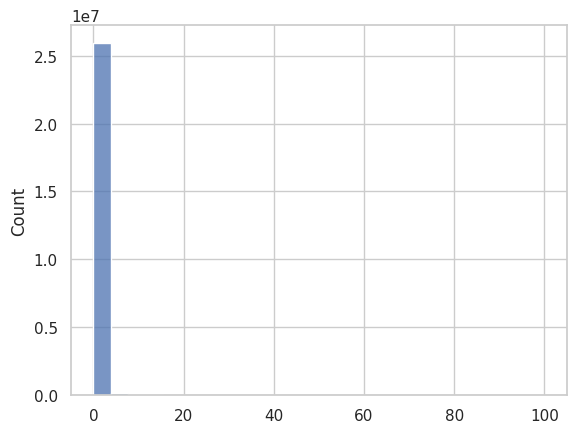

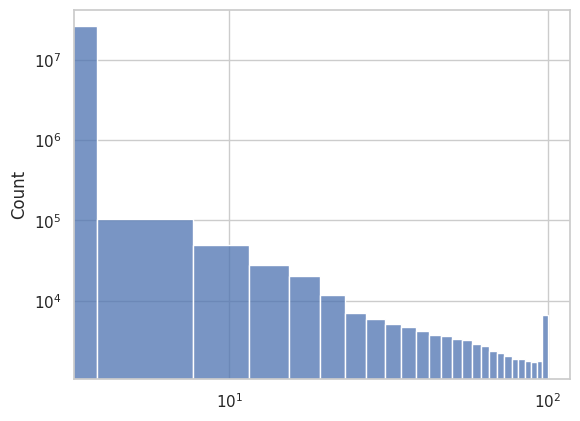

In [288]:
sns.histplot(means)
plt.show()
sns.histplot(means)
plt.xscale("log")
plt.yscale("log")
plt.show()

In [226]:
np.unique(bin_ids).tolist()

[1, 2, 3, 4, 5, 6, 7]

In [210]:
means.max(), means.mean(), means.min()

(41.8, 0.452, 0.002222)

In [225]:
x = np.random.randn(3, 140, 200)
x.mean(axis=(1,2)).shape

(3,)

In [ ]:
scipy.stats.bineed

/scratch/ewalt/miniconda3/envs/bfs-3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
/scratch/ewalt/miniconda3/envs/bfs-3.7/lib/python3.7/site-packages/numpy/lib/histograms.py:851: RuntimeWarning: overflow encountered in multiply
  f_indices = _unsigned_subtract(tmp_a, first_edge) * norm


IndexError: index -9223372036854775808 is out of bounds for axis 0 with size 23736948

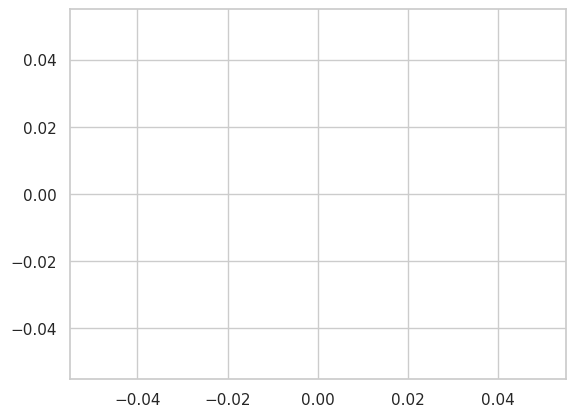

In [134]:
bins = np.array([1e-6, 0.5e-3, 0.8e-3, 1.5e-3, 1e-1, 1e2])
sns.histplot(np.exp(means))
plt.show()

In [150]:
means[means<bins[0]].shape, means[np.logical_and(bins[0]<means, means<bins[1])].shape

((0,), (280,))

In [151]:
280+9473+39833+88859+39678, means.shape

(178123, (178123,))

In [129]:
max(means), min(means)

(14.34, 0.0003176)

In [105]:
(means.shape[0]-means[means>0.5].shape[0])/means.shape[0]*100

90.38866401306962

0.05


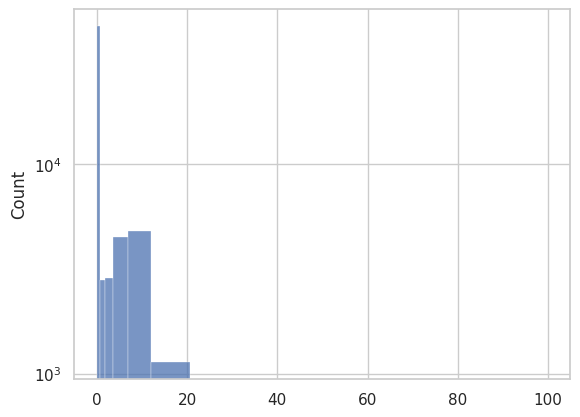

0.1


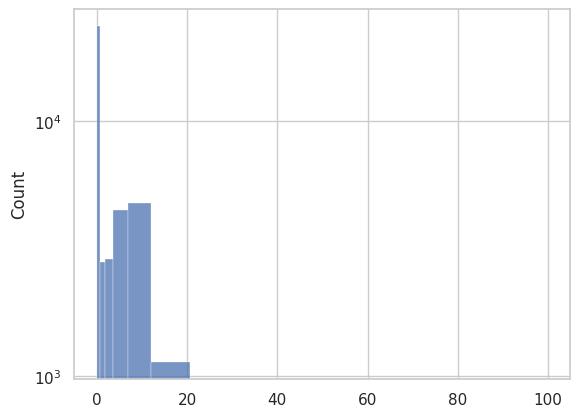

0.15


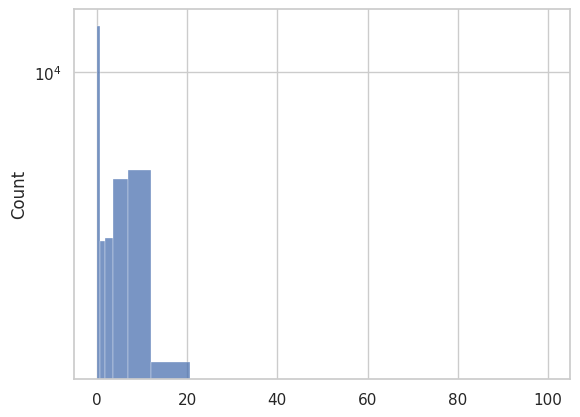

0.18


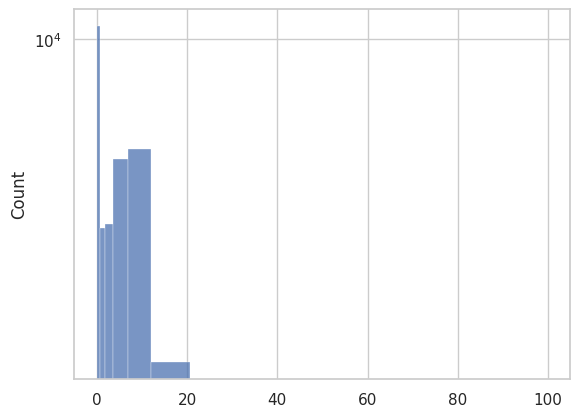

0.2


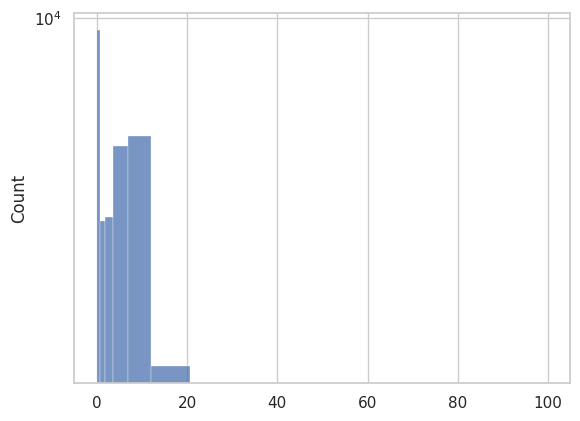

0.25


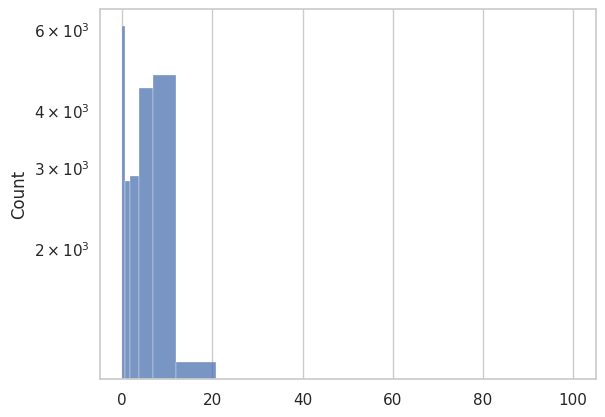

In [91]:
bins = np.logspace(np.log10(1), np.log10(101), 10)-1
means = np.array(means)
for mt in [0.05, 0.1, 0.15, 0.18, 0.2, 0.25]:
    print(mt)
    mm = means[means>mt]
    sns.histplot(mm, bins=bins)
    plt.yscale("log")
    plt.show()

In [92]:
means.max()

14.34

In [ ]:
cp_histogram = 0

In [38]:
patches.shape

(14, 15, 15)

In [60]:
patches.mean(axis=(1,2)), patches.mean()

(array([0.    , 0.    , 0.    , 0.    , 0.2045, 0.    , 0.    , 0.391 ,
        0.    , 0.    , 0.3555, 0.    , 0.    , 0.    ], dtype=float16),
 0.06793)

In [64]:
i,j

(3, 589)

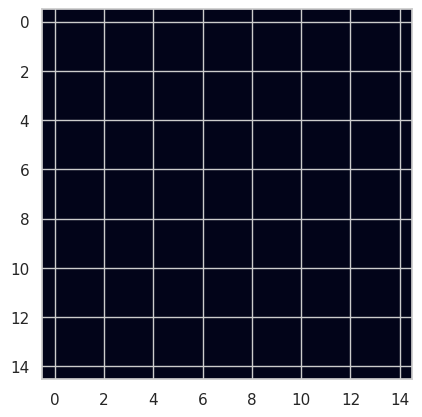

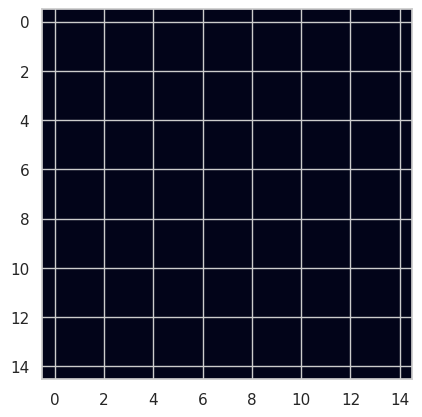

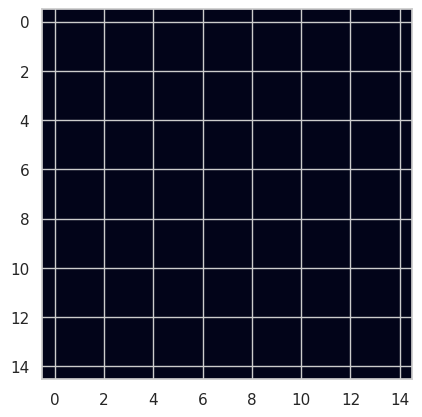

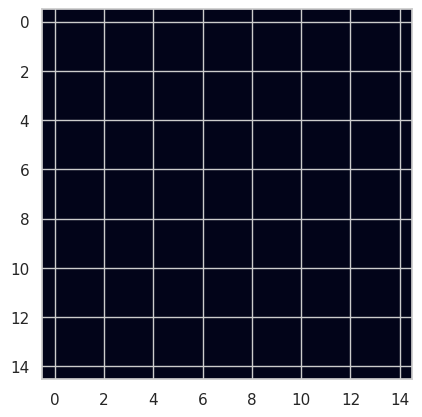

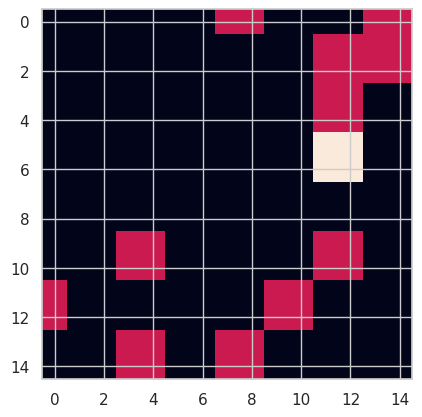

...

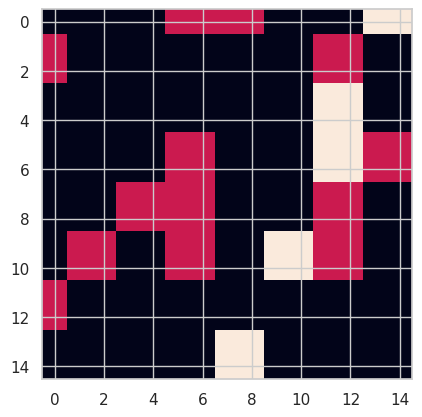

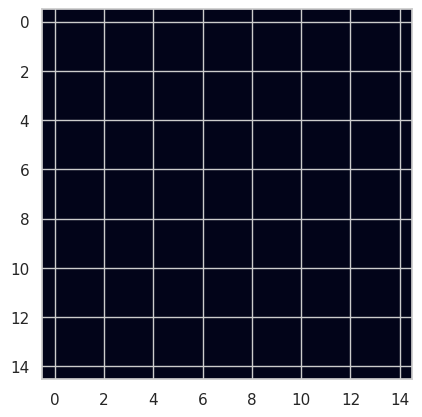

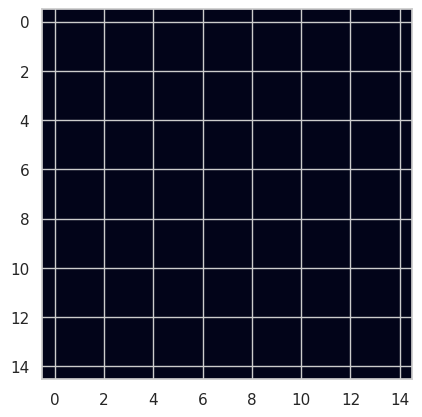

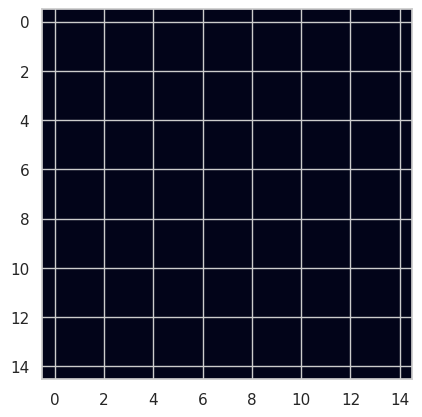

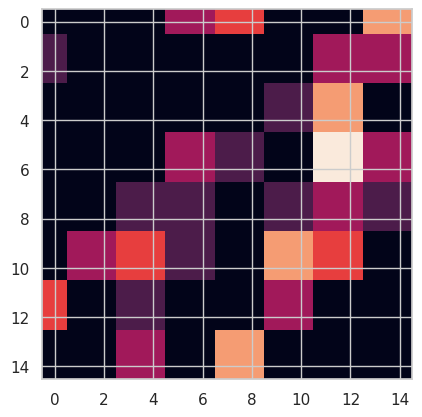

In [61]:
for patch in patches:
    plt.imshow(patch)
    plt.show()
plt.imshow(patches.mean(axis=0))

In [57]:
bins = np.logspace(np.log10(1), np.log10(2), 5)
bins

array([1.        , 1.18920712, 1.41421356, 1.68179283, 2.        ])

In [59]:
bins-1

array([0.        , 0.18920712, 0.41421356, 0.68179283, 1.        ])

In [58]:
for i in range(len(bins)-1):
    print(bins[i+1]-bins[i])

0.18920711500272103
0.22500644737037412
0.26757926813433386
0.318207169492571


In [48]:
for i in range(len(bins)-1):
    print(bins[i+1]-bins[i])

0.08005973889230611
0.08646930068381042
0.09339201031875666
0.10086895027950371
0.10894449210122192
0.11766655969260076
0.12708691373794623
0.1372614588684351
0.14825057542541908


In [98]:
with rasterio.open(s2_paths[0]) as fh:
    cloud_map = fh.read(13).astype("float")

(array([1.0473506e+07, 4.9986000e+04, 1.0462000e+04, 5.2760000e+03,
        3.6300000e+03, 2.6940000e+03, 2.2680000e+03, 1.6360000e+03,
        1.6200000e+03, 1.3080000e+03, 1.0640000e+03, 1.1080000e+03,
        8.5200000e+02, 8.9600000e+02, 8.5200000e+02, 7.7600000e+02,
        8.2800000e+02, 8.0800000e+02, 8.8800000e+02, 1.4340000e+04]),
 array([  0.,   5.,  10.,  15.,  20.,  25.,  30.,  35.,  40.,  45.,  50.,
         55.,  60.,  65.,  70.,  75.,  80.,  85.,  90.,  95., 100.]),
 <BarContainer object of 20 artists>)

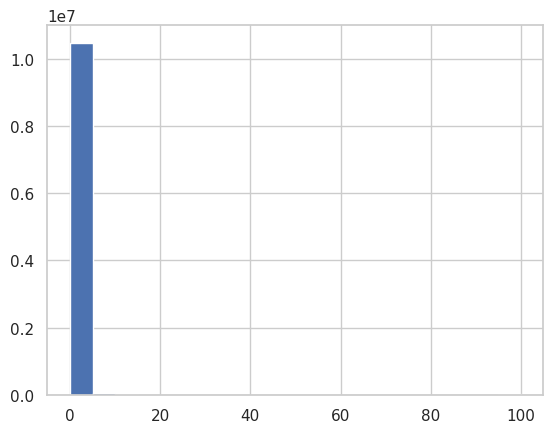

In [99]:
cm = cloud_map.flatten()
plt.hist(cm, bins=20)

[None]

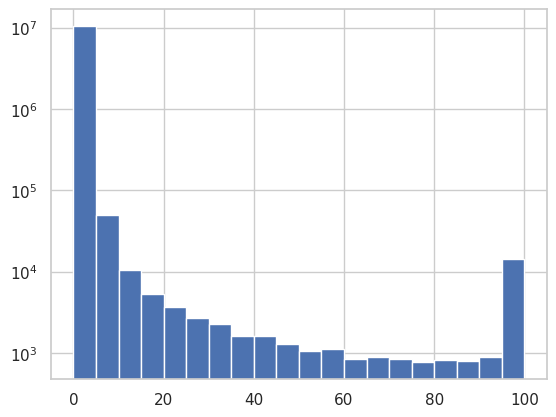

In [93]:
fig, ax = plt.subplots()
ax.hist(cm, bins=20)
ax.set(yscale="log")

In [97]:
from scipy.stats import entropy
np.mean(cm), np.std(cm), entropy(cm)

(0.32432827558502775, 4.392425552578171, 11.548479034721124)

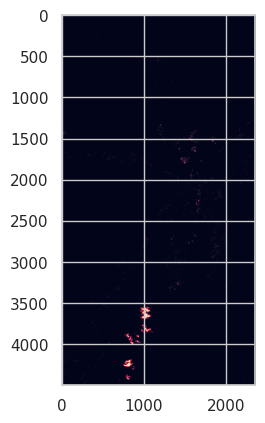

In [100]:
plt.imshow(cloud_map)

In [166]:
datetime(2015, 7, 1), datetime(2019, 2, 1)

(datetime.datetime(2015, 7, 1, 0, 0), datetime.datetime(2019, 2, 1, 0, 0))

In [129]:
date

datetime.datetime(2015, 8, 22, 0, 0)

In [130]:
th.date_bins

array(['2015-07-01T00:00:00', '2015-07-01T00:00:40',
       '2015-07-01T00:01:20', ..., '2019-01-31T23:58:00',
       '2019-01-31T23:58:40', '2019-01-31T23:59:20'],
      dtype='datetime64[s]')

In [131]:
date_i8 = np.datetime64(date, "s").view("i8")
np.digitize([date_i8], th.date_bins_i8)

array([112321])

In [132]:
len(th.date_bins)

2831760

In [157]:
date_bins.shape, pd_date_bins.shape

((40,), (40,))

In [158]:
np.datetime64(pd_date_bins[0]).view("i8"), date_bins[0]

(1435708800000000, 1435708800.0)

In [159]:
np.datetime64(pd_date_bins[-1]).view("i8"), date_bins[-1]

(1548979200000000, 1548979200.0)

In [65]:
class CloudAnalyzer:
    def __init__(self, level):
        assert level in ["pixel", "patch"]
        self.level = level
        if self.level == "pixel":
            cols = ["project", "S2 cloud probability", "date", "i", "j"]
        else:
            cols = ["project", "cloudy pixels fraction", "date", "i", "j", "t1"]
        self.df = pd.DataFrame(columns=cols)
    
    def add(self, project_id, date, array, **kwargs):
        if self.level=="patch": 
            for key in ["t1s", "i", "j"]:
                assert key in kwargs.keys()
            t1s = kwargs["t1s"]
            i = kwargs["i"]
            j = kwargs["j"]
            if not isinstance(t1s, list): t1s = [t1s]
            data = {"project": project_id, "date": date}
            for t1 in t1s:
                cloudy_fraction = (array > t1).sum()/(array.shape[0]*array.shape[1])
                data.update({
                    "cloudy pixels fraction": cloudy_fraction,
                    "i": i, "j": j, "t1": t1
                })
                self.df.append(data)
        else:
            print("array shape: ", array.shape)
            H, W = array.shape
            print("H,W: ", H,W)
            rows, cols = np.meshgrid(np.arange(H), np.arange(W), indexing="ij")
            print("rows, cols shape: ", rows.shape, cols.shape)
            rows, cols, array = rows.flatten(), cols.flatten(), array.flatten()
            subdf = {
                "project": [project_id for _ in range(H*W)],
                "date": [date for _ in range(H*W)],
                "S2 cloud probability": array.tolist(),
                "i": rows.tolist(), "j": rows.tolist()
            }
            for k, v in subdf.items():
                print(f"{k} length: {len(v)}")
            self.df = pd.concat([self.df, pd.DataFrame(subdf)], axis=0)

In [66]:
pixel_analyzer = CloudAnalyzer(level="pixel")
patch_analyzer = CloudAnalyzer(level="patch")

In [67]:
with open("config/create_dataset/baseline.yaml", "r") as f:
    cfg = yaml.safe_load(f)    

In [68]:
# arguments
patch_size = cfg["patch_size"]
s2_dir = cfg["s2_reprojected_dir"]
projects = cfg["projects"]

# core
for project_id in projects[:2]:
    print("Processing", project_id)
    # Load GT
    # gt_file = ...
    # Load Polygon
    # rasterized_polygon = ...
    # Load Split mask
    # split_mask = ...
    # images loop
    for img_path in pjoin(s2_dir, project_id).glob("*.tif"):
        with rasterio.open(img_path) as fh:
            cloud_map = fh.read(fh.count)
            date = parse_date(img_path.stem.split('_')[3].split('T')[0])
        pixel_analyzer.add(project_id, date, cloud_map)

Processing 346
array shape:  (4498, 2351)
H,W:  4498 2351
rows, cols shape:  (4498, 2351) (4498, 2351)
project length: 10574798
date length: 10574798
S2 cloud probability length: 10574798
i length: 10574798
j length: 10574798
array shape:  (4498, 2351)
H,W:  4498 2351
rows, cols shape:  (4498, 2351) (4498, 2351)
project length: 10574798
date length: 10574798
S2 cloud probability length: 10574798
i length: 10574798
j length: 10574798
array shape:  (4498, 2351)
H,W:  4498 2351
rows, cols shape:  (4498, 2351) (4498, 2351)
project length: 10574798
date length: 10574798
S2 cloud probability length: 10574798
i length: 10574798
j length: 10574798
array shape:  (4498, 2351)
H,W:  4498 2351
rows, cols shape:  (4498, 2351) (4498, 2351)
project length: 10574798
date length: 10574798
S2 cloud probability length: 10574798
i length: 10574798
j length: 10574798
Processing 342
array shape:  (481, 853)
H,W:  481 853
rows, cols shape:  (481, 853) (481, 853)
project length: 410293
date length: 410293
S2 

In [69]:
pixel_analyzer.df

,project,S2 cloud probability,date,i,j
0,346,0,2015-08-22,0,0
1,346,0,2015-08-22,0,0
2,346,0,2015-08-22,0,0
3,346,0,2015-08-22,0,0
4,346,0,2015-08-22,0,0
...,...,...,...,...,...
410288,342,0,2015-08-22,480,480
410289,342,0,2015-08-22,480,480
410290,342,0,2015-08-22,480,480
410291,342,0,2015-08-22,480,480


<AxesSubplot:xlabel='date', ylabel='S2 cloud probability'>

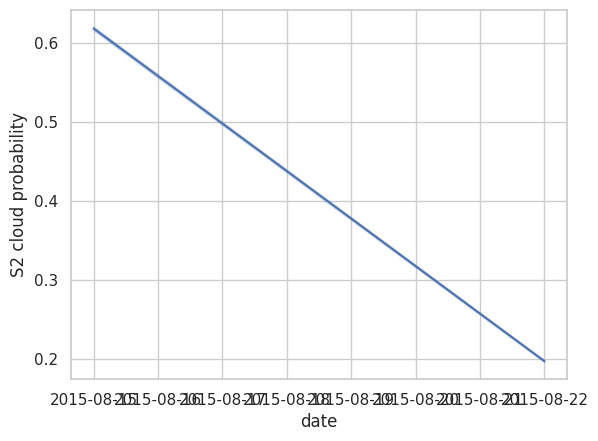

In [72]:
sns.lineplot(data=pixel_analyzer.df, x="date", y="S2 cloud probability")

In [64]:
H, W = 400, 400
np.meshgrid(H, W, indexing="ij")

[array([[400]]), array([[400]])]

In [77]:
date_bins = np.array([np.datetime64(datetime(2014, n, 1), 's') for n in range(1,13)])
date_bins_i8 = date_bins.view("i8")
np.digitize(date_bins_i8, date_bins_i8), np.digitize(date_bins_i8[0], date_bins_i8)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]), 1)

In [87]:
datetime.utcfromtimestamp(date_bins[0].tolist()/1e9)

TypeError: unsupported operand type(s) for /: 'datetime.datetime' and 'float'

In [90]:
date_bins[0].tolist()

datetime.datetime(2014, 1, 1, 0, 0)

In [80]:
np.datetime(2014, 10, 1)

datetime.datetime(2014, 10, 1, 0, 0)

In [150]:
class Histogram2D():
    def __init__(self, num_projects, num_bins, name, bins_range=(0,1)):
        """
        Creates 2D histogram (num_projects, num_bins)
        """
        self.num_projects = num_projects
        self.num_bins = num_bins
        self.name = name
        self.bins = np.linspace(*bins_range, self.num_bins)
        self.counts = np.zeros((self.num_projects, self.num_bins))
        self.project_map = {}
        self.project_counter = 0
        
    @property
    def inverted_project_map(self):
        return {v:k for k,v in self.project_map.items()}
    
    def add(self, values, project_id):
        assert self.project_counter<self.num_projects
        bin_ids = np.digitize(values, bins=self.bins)
        ids, cnts = np.unique(bin_ids, return_counts=True)
        self.counts[self.project_counter, ids] += cnts
        self.project_map[project_id] = self.project_counter
        self.project_counter += 1
        
    def to_df(self, density):
        y = "probability" if density else "count"
        data = {"project": [], "bin_value": [], y: [], "name": []}
        Y = self.counts/self.counts.sum(axis=1, keepdims=True) \
            if density else self.counts
        for project_idx in range(self.counts.shape[0]):
            project_id = self.inverted_project_map[project_idx]
            for bin_idx in range(self.num_bins):
                data["project"].append(project_id)
                data["bin_value"].append(self.bins[bin_idx])
                data[y].append(Y[project_idx,bin_idx])
                data["name"].append(self.name)
        cdf = pd.DataFrame(data)
        return cdf
        
    def plot(self, ax=None, density=False):
        if ax is None: fig, ax = plt.subplots()
        cdf = self.to_df(density)
        y = "probability" if density else "count"
        sns.lineplot(data=cdf, x="bin_value", y=y, ax=ax, hue="name")
        return ax
    
def plot_multiple_histograms(histograms, ax=None, density=False):
    if ax is None: fig, ax = plt.subplots()
    df = pd.concat([h.to_df(density) for h in histograms])
    y = "probability" if density else "count"
    sns.lineplot(data=df, x="bin_value", y=y, hue="name", ax=ax)
    return ax

In [ ]:
class ProjectCloudAnalyzer():
    def __init__(
        self,
        project_id,
    ):
        self.project_id = project_id
        # external
        self.gt = self.load_gt
        self.patch_size = 15
        self.patch_half
        #histograms
        self.pixel_histogram = 
        self.

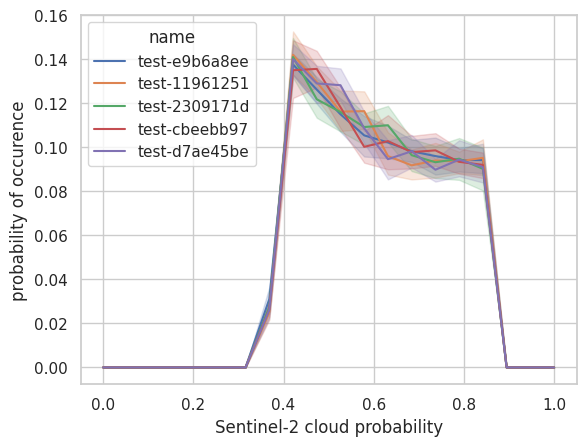

In [149]:
hs = []
for _ in range(5):
    ng, nb = 10, 20
    self = Histogram2D(ng, nb, "test-"+str(uuid.uuid4()).split("-")[0])
    for _ in range(ng):
        values = np.sin(np.exp(-np.random.rand(ng*50)))
        self.add(values, project_id=str(uuid.uuid4()).split("-")[0])
    hs.append(self)
ax = plot_multiple_histograms(hs, density=True)
ax.set(xlabel="Sentinel-2 cloud probability", 
       ylabel="probability of occurence")
plt.show()

In [126]:
df = pd.concat([h.to_df() for h in hs])
df

,project,bin_value,count,name
0,9888f351,0.000000,0.0,test
1,9888f351,0.052632,31.0,test
2,9888f351,0.105263,27.0,test
3,9888f351,0.157895,18.0,test
4,9888f351,0.210526,32.0,test
...,...,...,...,...
195,ea242b4b,0.789474,42.0,test
196,ea242b4b,0.842105,35.0,test
197,ea242b4b,0.894737,0.0,test
198,ea242b4b,0.947368,0.0,test


In [101]:
data = {"group": [], "bin": [], "count": []}
for group_idx in range(self.counts.shape[0]):
    group_id = self.inverted_group_map[group_idx]
    for bin_idx in range(self.num_bins):
        data["group"].append(group_id)
        data["bin"].append(bin_idx)
        data["count"].append(self.counts[group_idx,bin_idx])
cdf = pd.DataFrame(data)
cdf

,group,bin,count
0,4d91c0cc,0,0.0
1,4d91c0cc,1,30.0
2,4d91c0cc,2,20.0
3,4d91c0cc,3,25.0
4,4d91c0cc,4,39.0
...,...,...,...
195,bbc72a83,15,34.0
196,bbc72a83,16,45.0
197,bbc72a83,17,0.0
198,bbc72a83,18,0.0


<AxesSubplot:xlabel='bin', ylabel='count'>

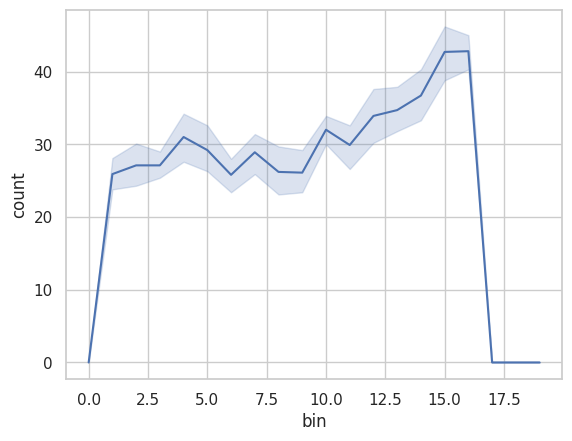

In [109]:
sns.lineplot(data=cdf[cdf.group!="global"], x="bin", y="count")

In [93]:
(all_counts[-1]==agg_counts).all()

True

In [49]:
testH.counts.sum(axis=0)

array([  0., 502., 513., 509., 466., 554., 507., 517., 500., 494., 525.,
       510., 489., 535., 472., 481., 502., 524., 508., 527., 507., 499.,
       492., 531., 489., 470., 472., 520., 517., 539., 508., 510., 524.,
       507., 546., 473., 533., 482., 457., 528., 518., 518., 523., 550.,
       506., 504., 480., 466., 500., 500., 482., 523., 509., 495., 539.,
       529., 515., 509., 499., 493., 527., 530., 527., 512., 486., 521.,
       520., 493., 486., 498., 512., 473., 511., 496., 513., 500., 517.,
       514., 484., 477., 520., 519., 480., 544., 501., 502., 470., 499.,
       499., 512., 524., 457., 521., 485., 501., 481., 528., 496., 487.,
       480.])

In [3]:
np.stack([np.linspace(0,1,10) for _ in range(4)], axis=0).shape

(4, 10)

In [73]:
bins = np.linspace(0,1,10)
counts = np.zeros((4, 10))
values = np.random.rand(100,100)
counter = 0
bin_ids = np.digitize(values, bins=bins)-1


In [74]:
bin_ids.shape

(100, 100)

(array([ 7., 18.,  7., 12.,  5.,  6., 16., 13., 16.]),
 array([0.        , 0.11111111, 0.22222222, 0.33333333, 0.44444444,
        0.55555556, 0.66666667, 0.77777778, 0.88888889, 1.        ]),
 <BarContainer object of 9 artists>)

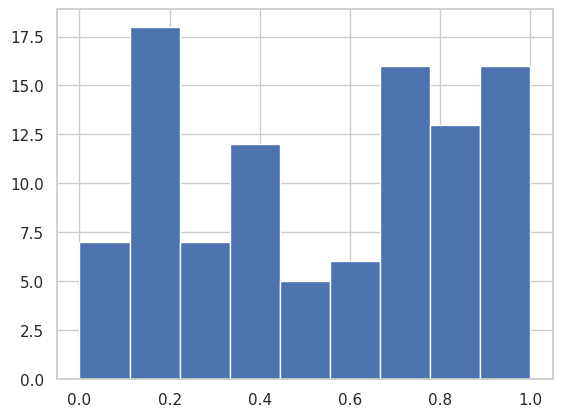

In [34]:
plt.hist(values, bins=bins)

In [35]:
# for bin_id in bin_ids:
#     counts[counter, bin_id] += 1
counts[counter, bin_ids] += 1

<BarContainer object of 10 artists>

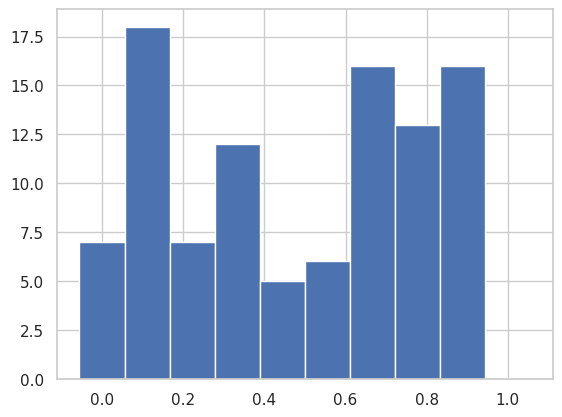

In [42]:
plt.bar(bins, counts[counter+1], width=(bins.max()-bins.min())/(len(bins)-1))

In [25]:
counts[counter]

array([12., 11.,  8.,  7., 15., 10.,  7., 20., 10.,  0.])

In [28]:
plt.bar?

In [37]:
ids, cnts = np.unique(bin_ids, return_counts=True)
ids, cnts

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 array([ 7, 18,  7, 12,  5,  6, 16, 13, 16]))

In [38]:
counts[counter+1, ids] += cnts

In [43]:
bins

array([0.        , 0.11111111, 0.22222222, 0.33333333, 0.44444444,
       0.55555556, 0.66666667, 0.77777778, 0.88888889, 1.        ])